# Plot distributions of Individual Parameters
# Compute Group Optimized Parameters
# Test Optimized Parameters using Unseen Dataset

In [1]:
import os
import pandas as pd
from activity_count_function import *
from group_analysis_functions import *
from individual_analysis_ac_functions import *
from utilities import *
from individual_analysis_fs_functions import *
from gm_function import *

C:\Users\Pierre-Louis\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\Pierre-Louis\anaconda3\lib\site-packages\numpy\.libs\libopenblas.QVLO2T66WEPI7JZ63PS3HMOHFEY472BC.gfortran-win_amd64.dll
C:\Users\Pierre-Louis\anaconda3\lib\site-packages\numpy\.libs\libopenblas.XWYDX2IKJW2NMTWSFYNGFUWKQU3LYTCZ.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
# PATHS #
initial_path = '../CreateStudy'
figures_path = '../CreateStudy/figures'

In [3]:
# Get datasets for both H and S groups 
h_json_files = get_json_paths(initial_path, 'H')
s_json_files = get_json_paths(initial_path, 'S')

In [4]:
# CONSTANTS
threshold_labels = ['CT', 'OT']
side_labels = ['ndh', 'DH', 'bilateral']
metric_labels = ['Sensitivity', 'Specificity', 'Accuracy']
metric_names_to_plot = ['Accuracy']

# Constants related to thresholds
conventional_functional_space = 30
conventional_threshold_unilateral = 2  # Bailey and Lang, 2013
conventional_threshold_bilateral = 0  # Bailey and Lang, 2013

# Constants related to metric frequencies
frequency_GT = 25  # Hz
frequency_gm = 2   # Hz
frequency_gmac = 1  # Hz

In [5]:
# PART 1 # 
# Analysis accross individual participant # 
# Distribution of individual parameters 

In [6]:
# Get data across participants for H group
# Get array of optimal parameters across participants
h_array_optimal_AC_NDH, h_array_optimal_AC_DH, h_array_optimal_FS_NDH, h_array_optimal_FS_DH = extract_values_across_participants(h_json_files, 'optimal_AC_NDH', 'optimal_AC_DH', 'optimal_FS_NDH', 'optimal_FS_DH')
# Get array of evaluation metrics across participants
h_array_evaluation_metrics_AC, h_array_evaluation_metrics_GM, h_array_evaluation_metrics_GMAC = extract_values_across_participants(h_json_files, 'metrics_dictionary_AC', 'metrics_dictionary_GM', 'metrics_dictionary_GMAC')

In [7]:
# Get data across participants for S group
# Get array of optimal parameters across participants
s_array_optimal_AC_NDH, s_array_optimal_AC_DH, s_array_optimal_FS_NDH, s_array_optimal_FS_DH = extract_values_across_participants(s_json_files, 'optimal_AC_NDH', 'optimal_AC_DH', 'optimal_FS_NDH', 'optimal_FS_DH')
# Get array of evaluation metrics across participants
s_array_evaluation_metrics_AC, s_array_evaluation_metrics_GM, s_array_evaluation_metrics_GMAC = extract_values_across_participants(s_json_files, 'metrics_dictionary_AC', 'metrics_dictionary_GM', 'metrics_dictionary_GMAC')

Figure saved at ../CreateStudy/figures/boxplot_across_individuals_AC_H_S_Accuracy.png


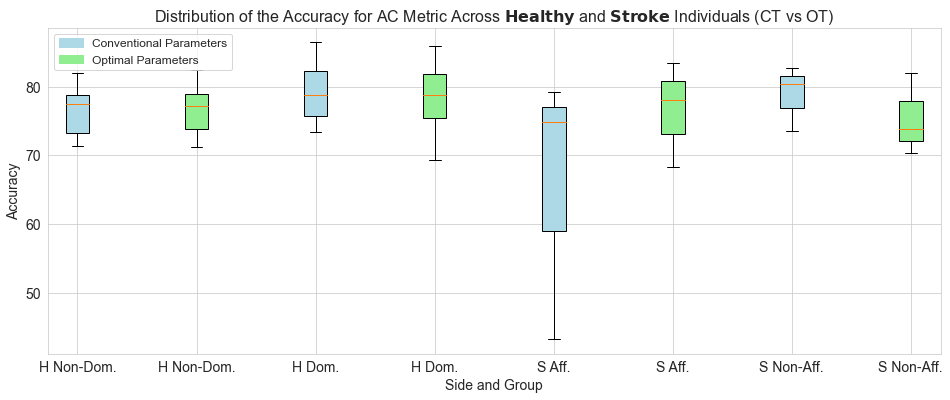

In [8]:
# Plot for AC 
plot_side_metrics(h_array_evaluation_metrics_AC, s_array_evaluation_metrics_AC, metric_names_to_plot, algorithm ='AC', save_path=figures_path)

Figure saved at ../CreateStudy/figures/boxplot_across_individuals_GM_H_S_Accuracy.png


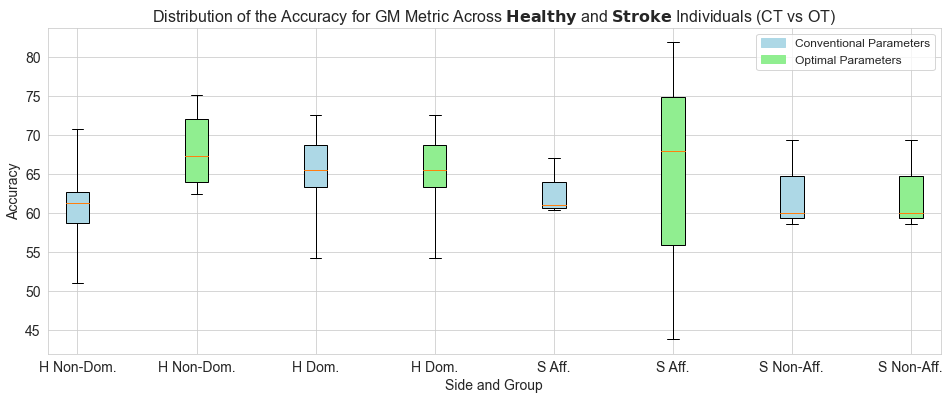

In [9]:
# Plot for GM
plot_side_metrics(h_array_evaluation_metrics_GM, s_array_evaluation_metrics_GM, metric_names_to_plot, algorithm ='GM', save_path=figures_path)

Figure saved at ../CreateStudy/figures/boxplot_across_individuals_GMAC_H_S_Accuracy.png


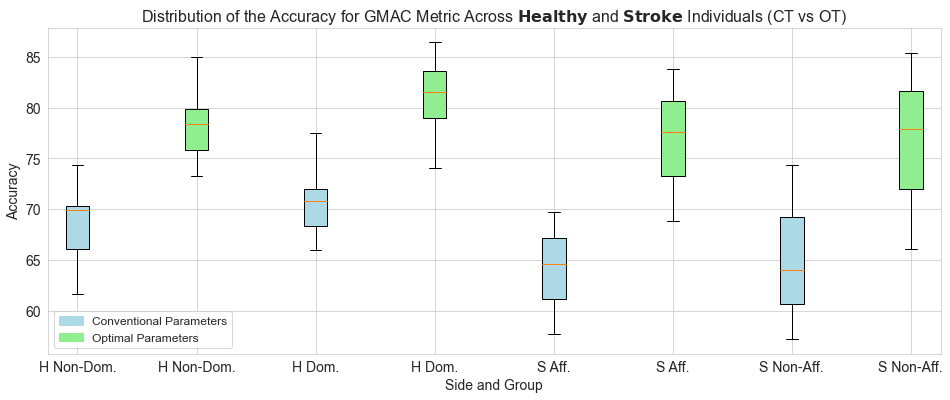

In [10]:
# Plot for GMAC 
plot_side_metrics(h_array_evaluation_metrics_GMAC, s_array_evaluation_metrics_GMAC, metric_names_to_plot, algorithm ='GMAC', save_path=figures_path)

In [11]:
# PART 2 # 
# TRAINING OPTIMAL PARAMETRS PER GROUP # 

In [12]:
# CHANGE VALUE HERE # 
# Participant to remove from the training (in case testing participant is within the training group)
excluded_participant =  'H004'
excluded_participant_group = 'H'
# Group we want to use for the group optimal parameters
trained_group = 'H'

In [13]:
training_participant_paths = get_json_paths(initial_path, group = excluded_participant_group, excluded_participant=excluded_participant)

In [14]:
# Group Analysis for optimal AC Thresholds #

AC detected


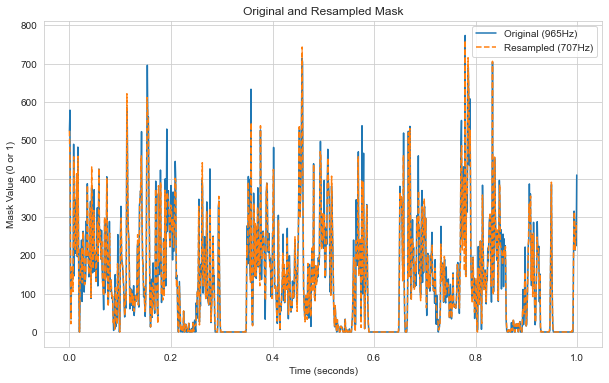

AC detected


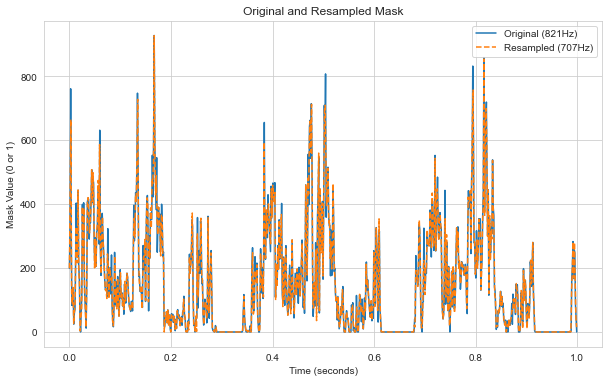

AC detected


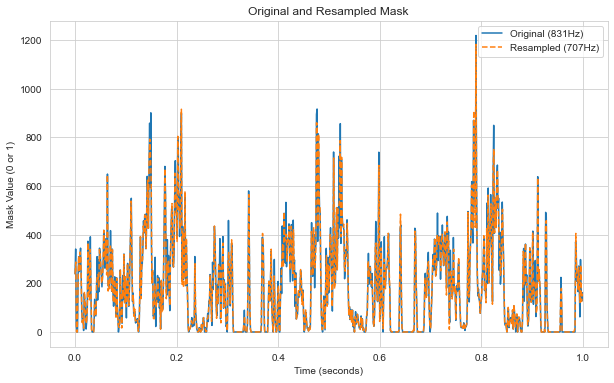

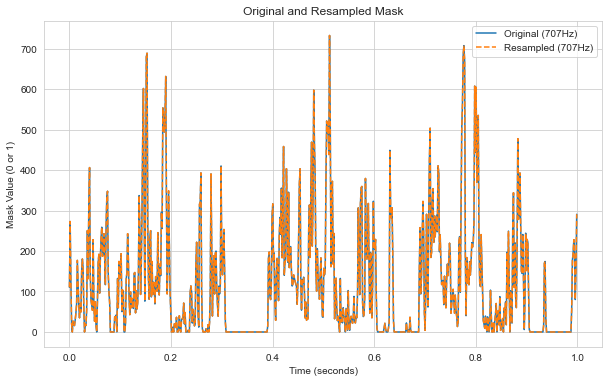

AC detected


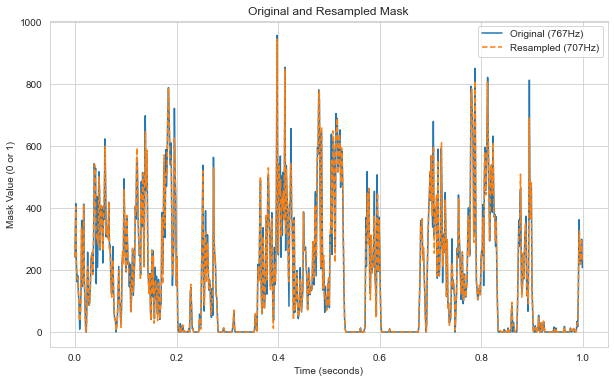

AC detected


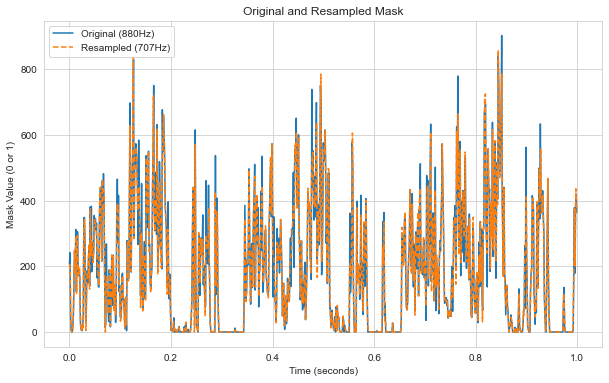

AC detected


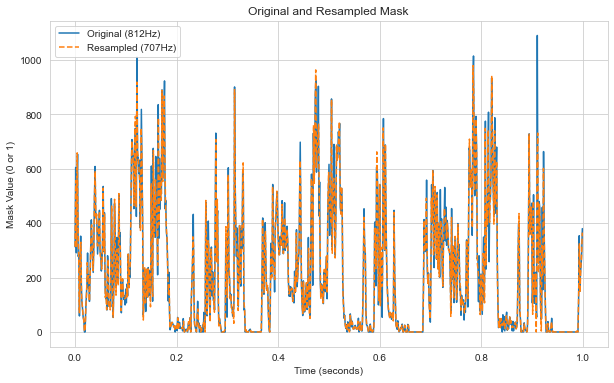

AC detected


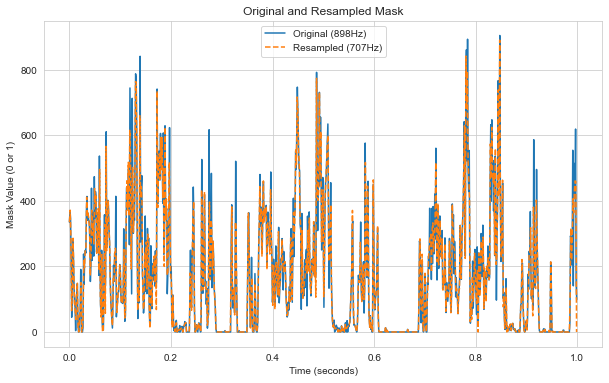

AC detected


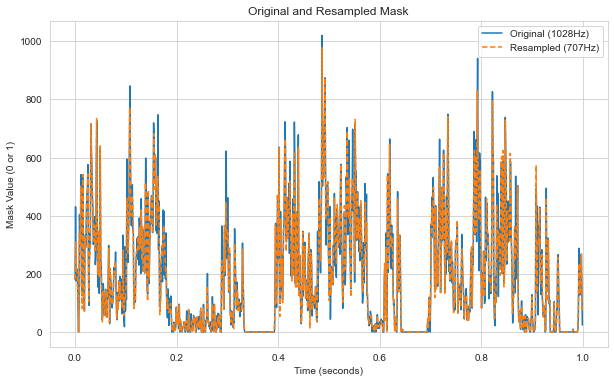

AC detected


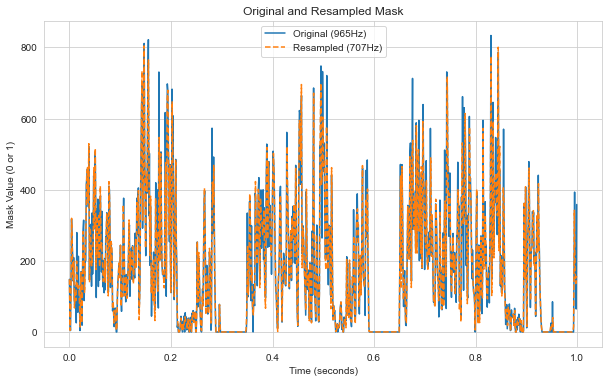

AC detected


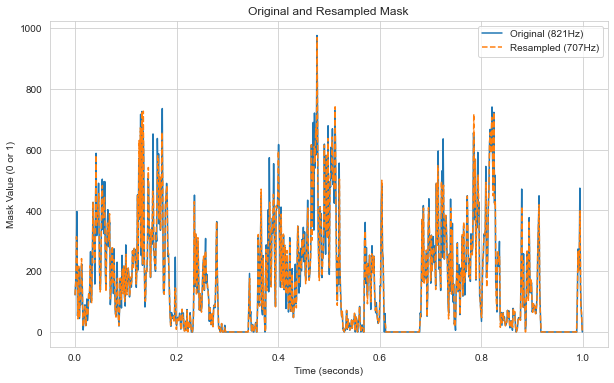

AC detected


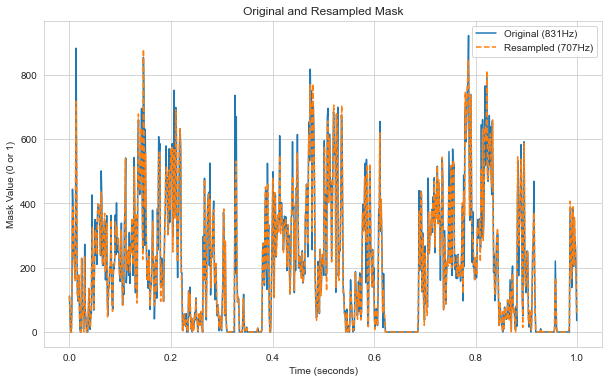

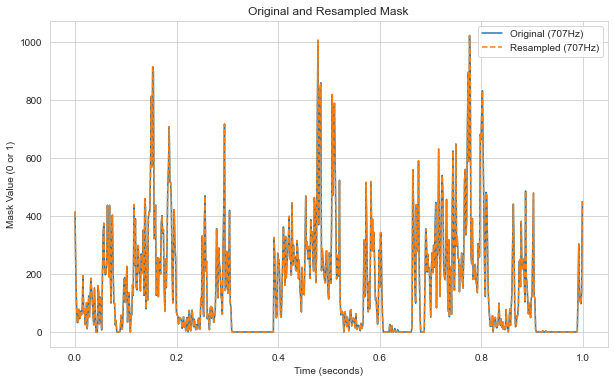

AC detected


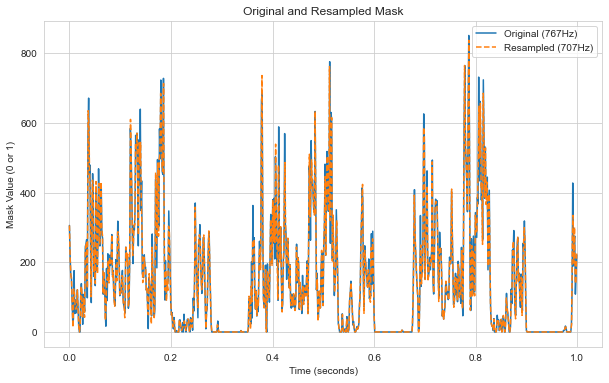

AC detected


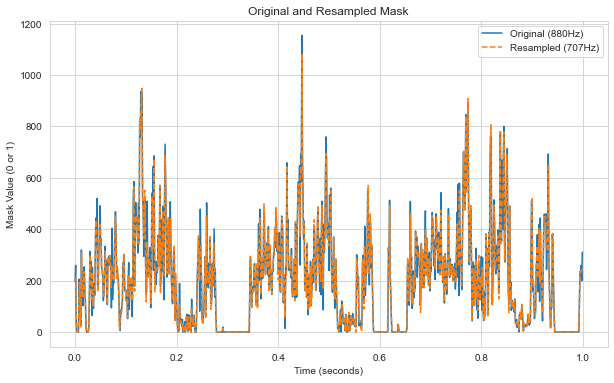

AC detected


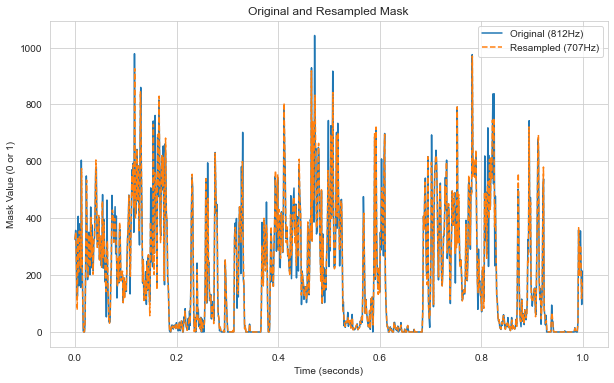

AC detected


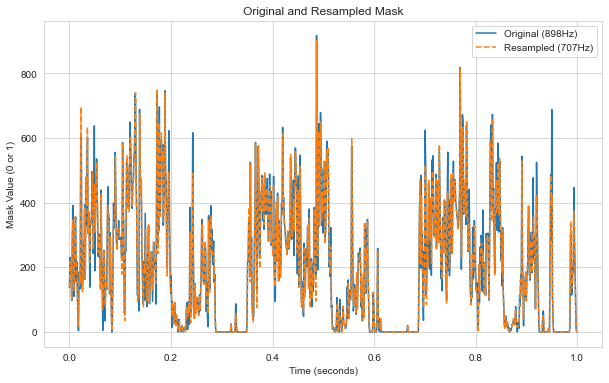

AC detected


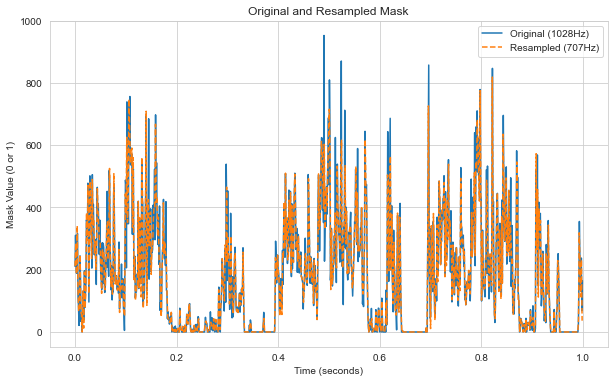

Mask detected


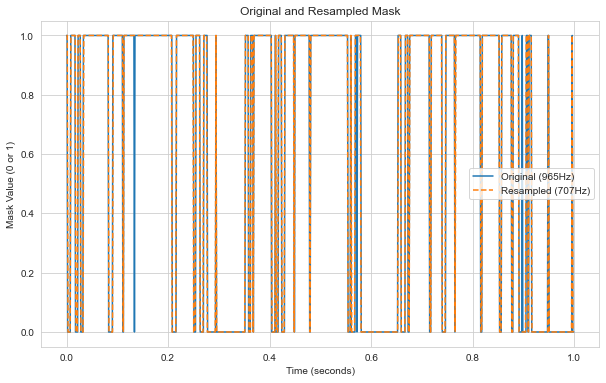

Mask detected


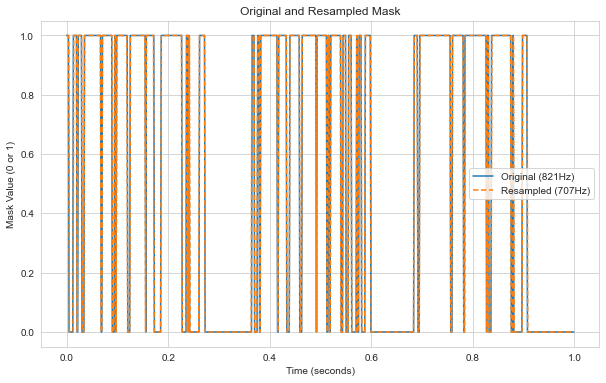

Mask detected


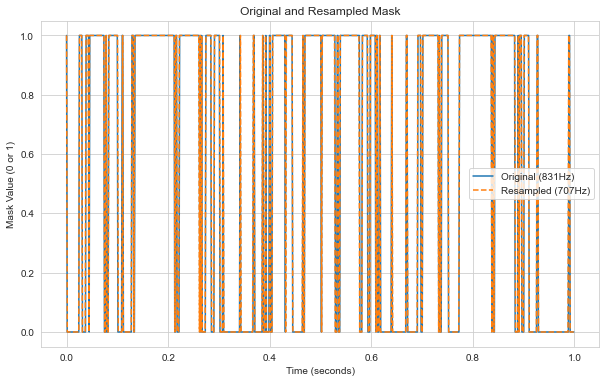

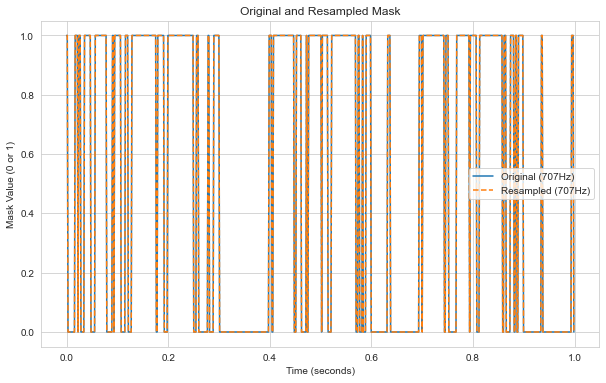

Mask detected


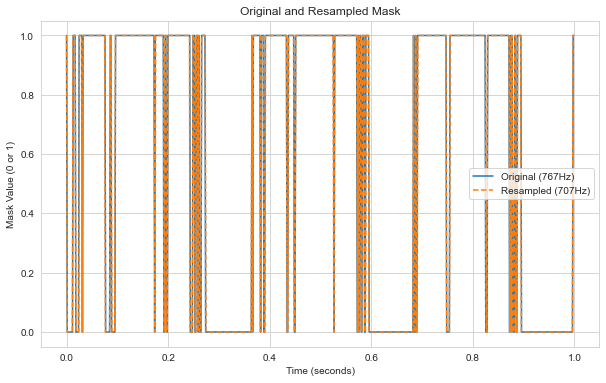

Mask detected


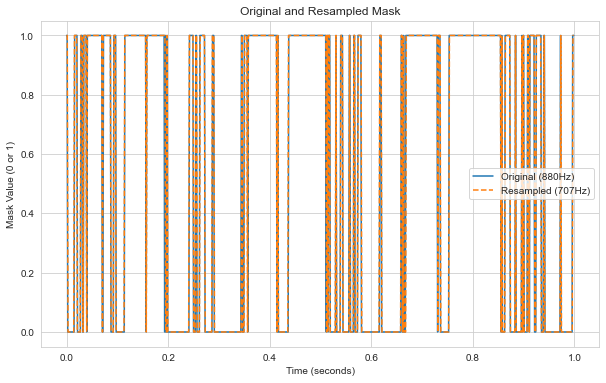

Mask detected


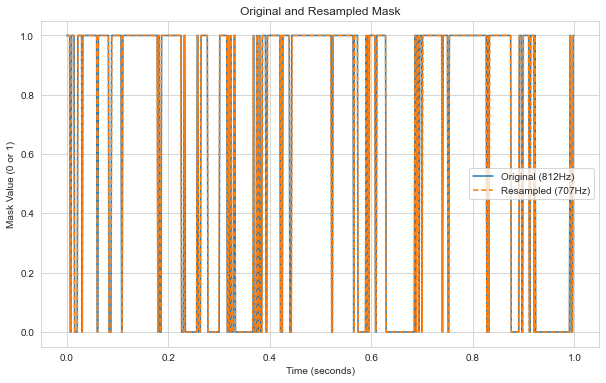

Mask detected


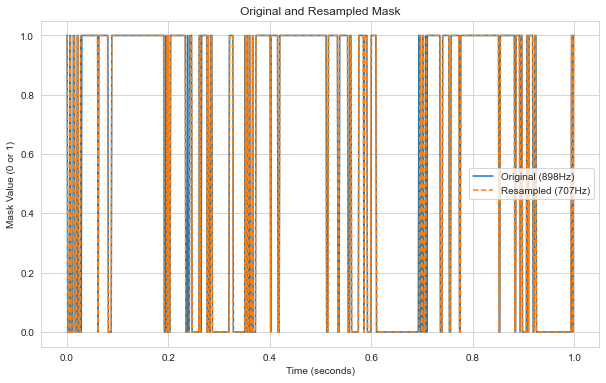

Mask detected


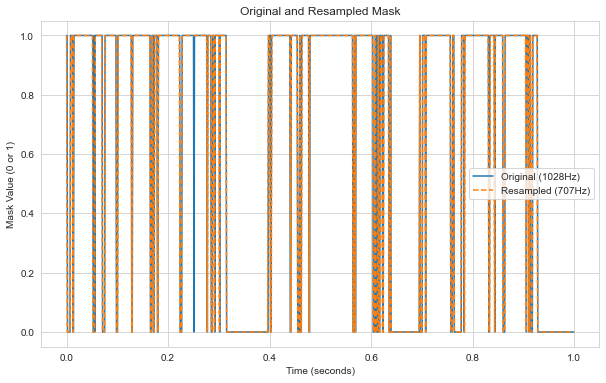

Mask detected


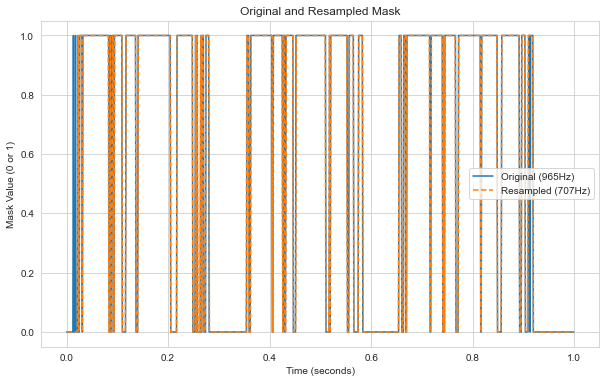

Mask detected


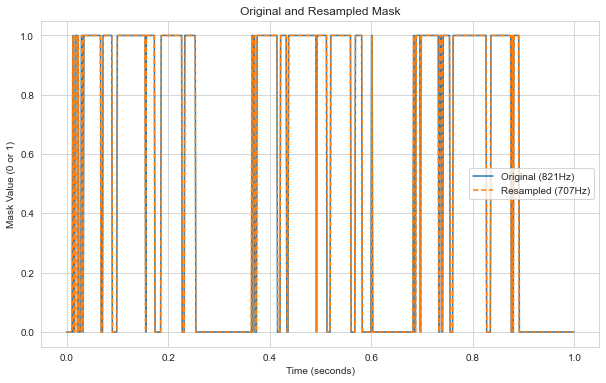

Mask detected


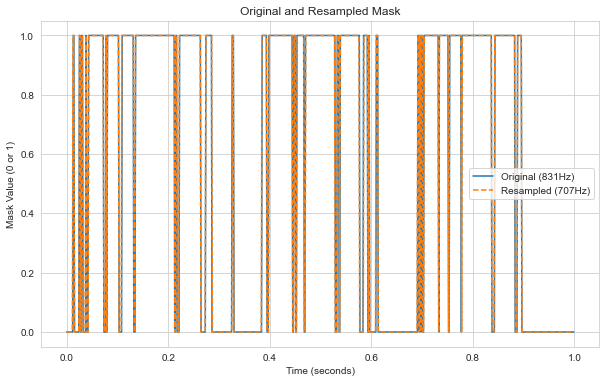

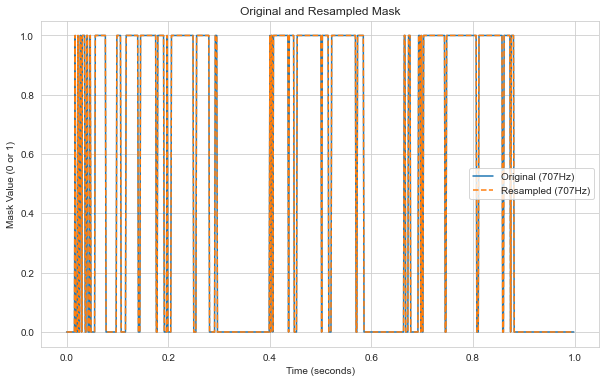

Mask detected


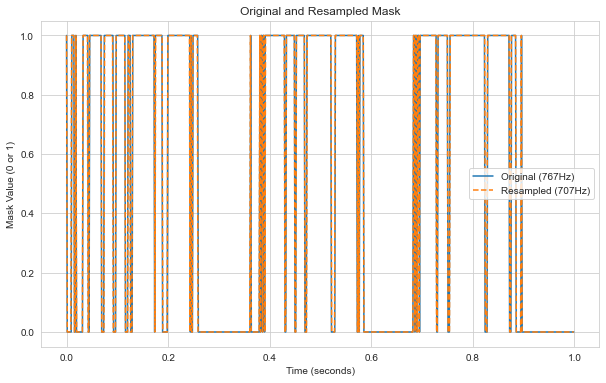

Mask detected


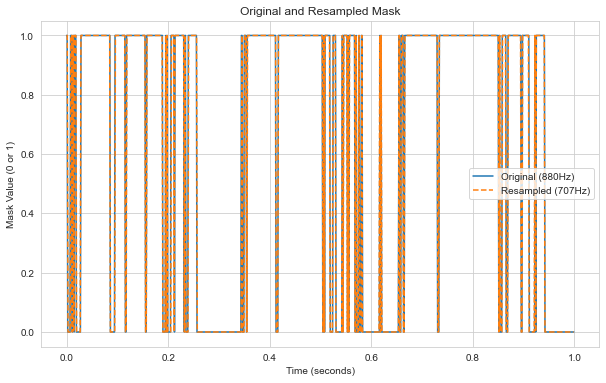

Mask detected


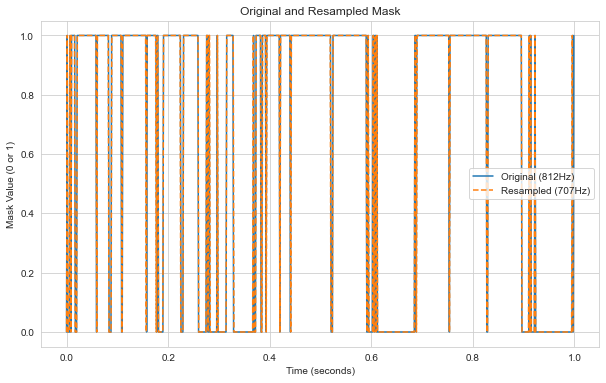

Mask detected


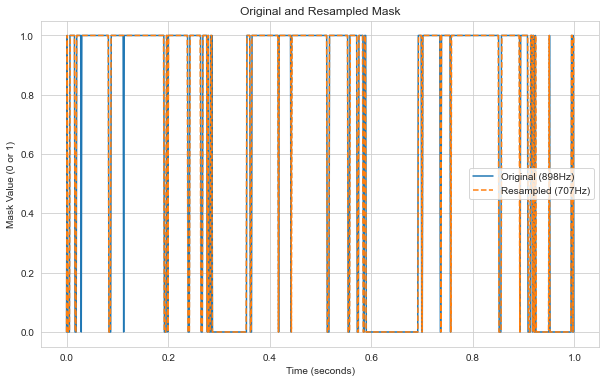

Mask detected


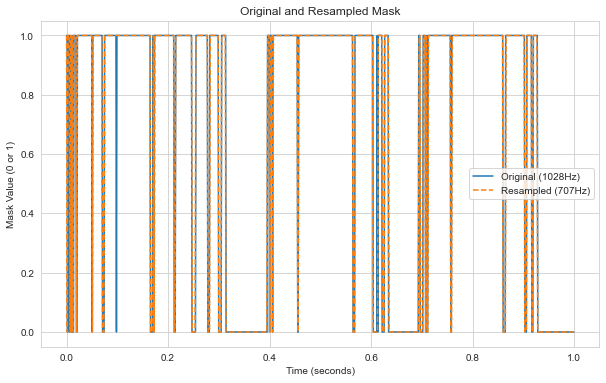

In [15]:
# Get group dataset using resampling 
# Resample to the smallest dataset within the selected group
# Plots to ensure the downsampling is correct 
group_AC_NDH = get_group_data(training_participant_paths, field = 'AC_NDH')
group_AC_DH = get_group_data(training_participant_paths, field = 'AC_DH')
group_GT_mask_NDH_1Hz = get_group_data(training_participant_paths, field = 'GT_mask_NDH_1Hz')
group_GT_mask_DH_1Hz = get_group_data(training_participant_paths, field = 'GT_mask_DH_1Hz')

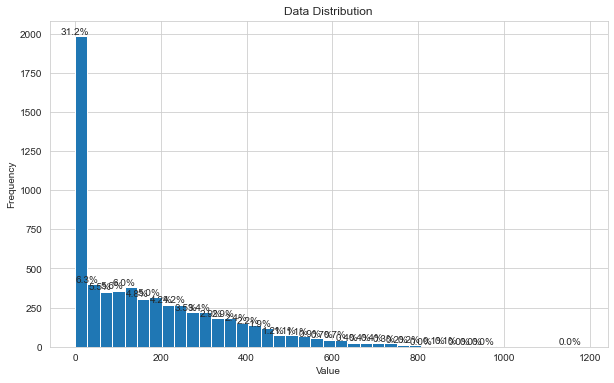

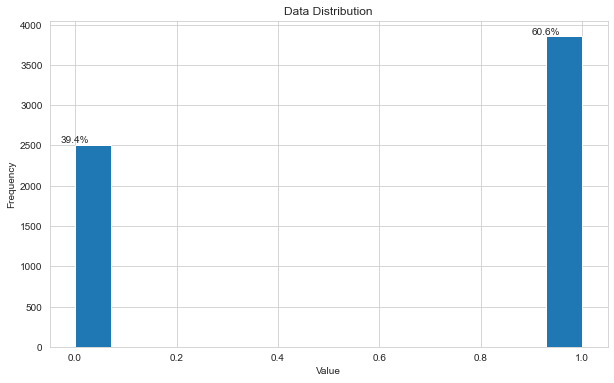

({'mean': 172.7695277321427,
  'median': 121.65960368202619,
  'iqr': 268.4887829443897,
  'range': 1182.5954973874489,
  'std': 182.63070804739496,
  'max': 1182.5954973874489,
  'min': 0.0,
  'num_elements': 6363},
 {'mean': 0.606003457488606,
  'median': 1.0,
  'iqr': 1.0,
  'range': 1,
  'std': 0.4886340829296103,
  'max': 1,
  'min': 0,
  'num_elements': 6363})

In [16]:
# Plot to ensure the downsampling is correct 
get_statistics(group_AC_NDH), get_statistics(group_GT_mask_NDH_1Hz)

In [17]:
# Compute Group Optimal AC thresholds using ROC Analysis 
# Optimal: found by maximization of the Younden Index 
group_optimal_AC_NDH = optimal_group_ac_threshold_computation(group_AC_NDH, group_GT_mask_NDH_1Hz)
group_optimal_AC_DH = optimal_group_ac_threshold_computation(group_AC_DH, group_GT_mask_DH_1Hz)
# Save  the group optimal AC threshold values  
save_optimal_threshold(initial_path, group_optimal_AC_NDH, group_optimal_AC_DH, AC = True, group = trained_group)

Iteration 1/5
AUC: 0.8053057601410893
Optimal Threshold: 18.00
Conventional Threshold: 2.00
AUC is clinically useful (≥0.75)
Iteration 2/5
AUC: 0.8090846480254521
Optimal Threshold: 27.00
Conventional Threshold: 2.00
AUC is clinically useful (≥0.75)
Iteration 3/5
AUC: 0.804580652465354
Optimal Threshold: 17.00
Conventional Threshold: 2.00
AUC is clinically useful (≥0.75)
Iteration 4/5
AUC: 0.8060232038646894
Optimal Threshold: 29.00
Conventional Threshold: 2.00
AUC is clinically useful (≥0.75)
Iteration 5/5
AUC: 0.8067767030640705
Optimal Threshold: 29.00
Conventional Threshold: 2.00
AUC is clinically useful (≥0.75)
Iteration 1/5
AUC: 0.806374862482849
Optimal Threshold: 12.00
Conventional Threshold: 2.00
AUC is clinically useful (≥0.75)
Iteration 2/5
AUC: 0.8090481892750153
Optimal Threshold: 10.00
Conventional Threshold: 2.00
AUC is clinically useful (≥0.75)
Iteration 3/5
AUC: 0.8054473040929274
Optimal Threshold: 10.00
Conventional Threshold: 2.00
AUC is clinically useful (≥0.75)
It

In [18]:
print(group_optimal_AC_NDH, group_optimal_AC_DH)

24.0 11.6


In [19]:
# Group Analysis for optimal FS for the GM metric #

Mask detected


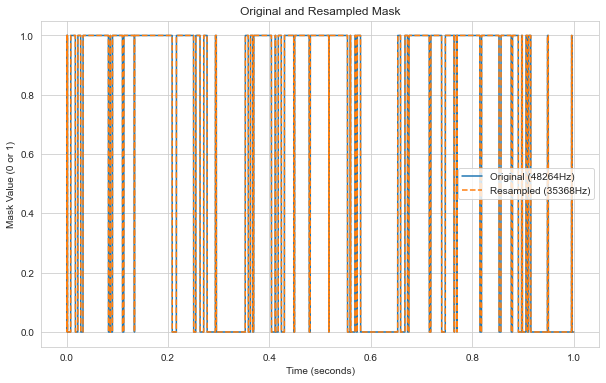

Mask detected


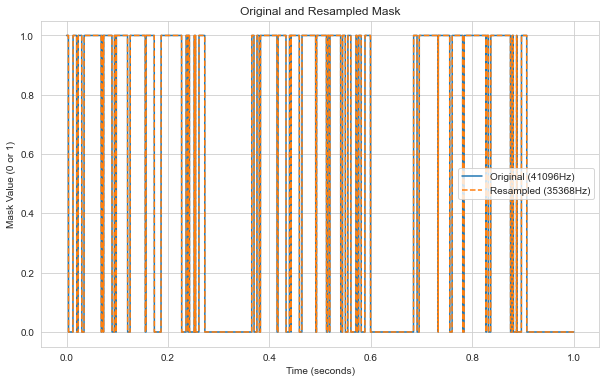

Mask detected


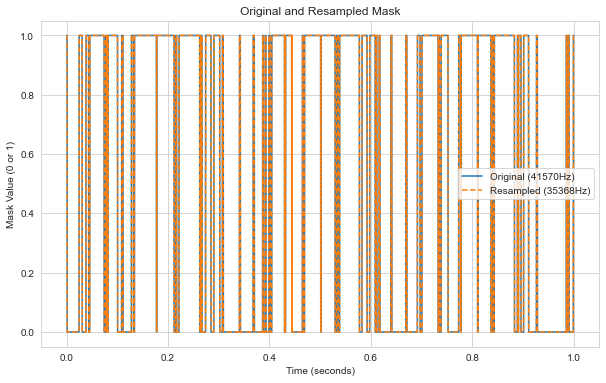

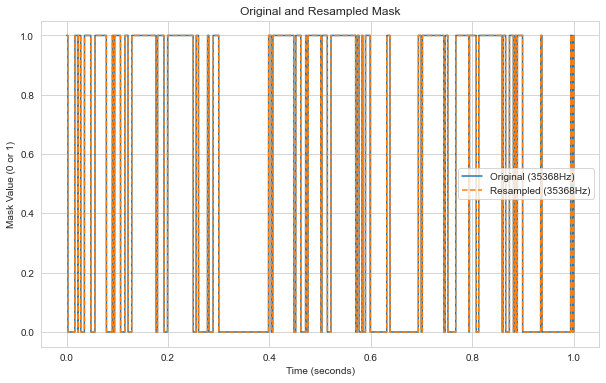

Mask detected


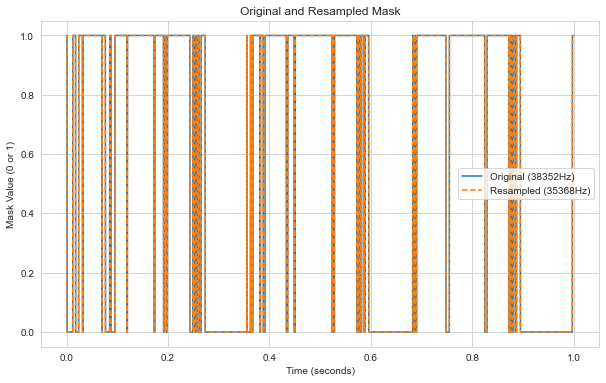

Mask detected


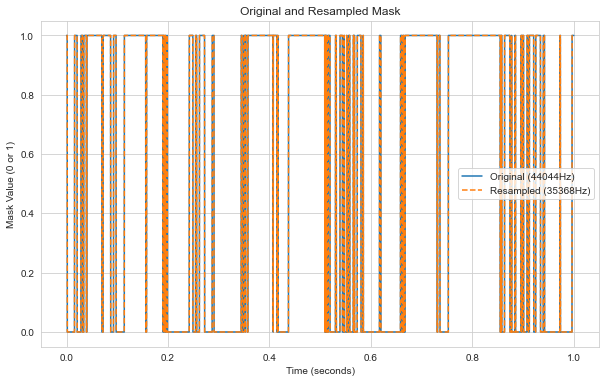

Mask detected


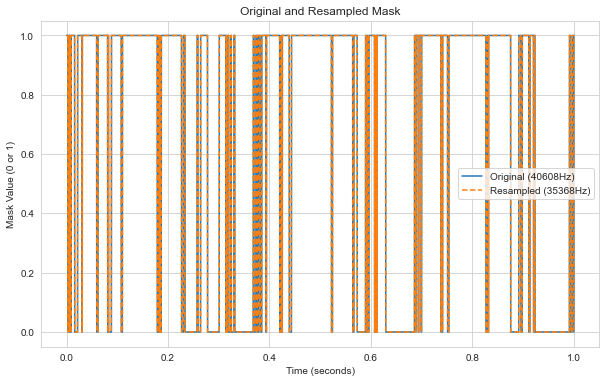

Mask detected


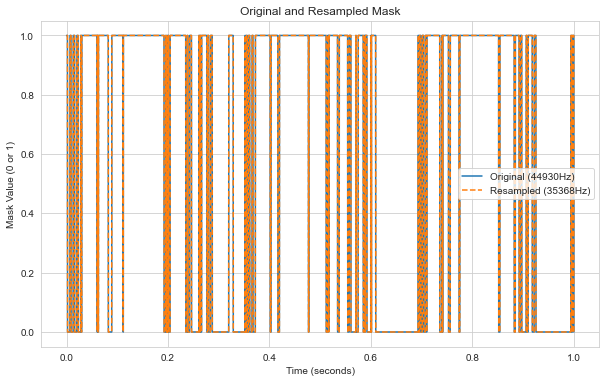

Mask detected


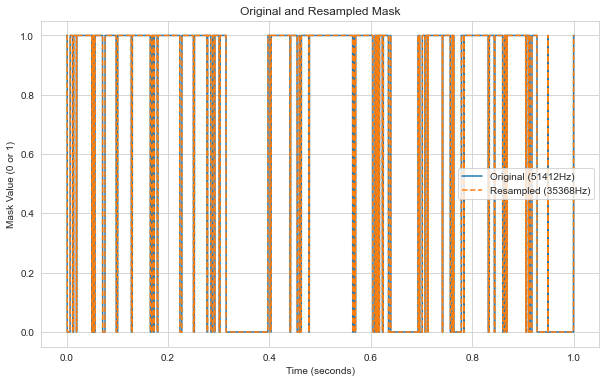

Mask detected


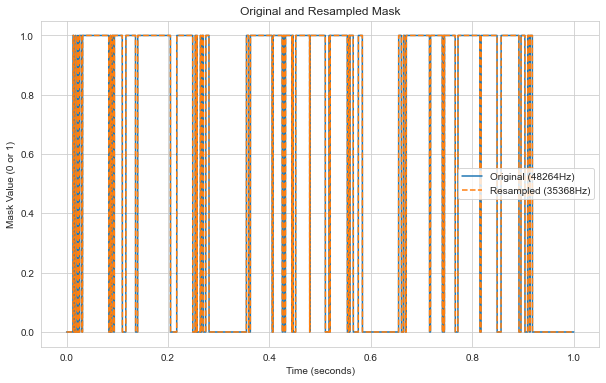

Mask detected


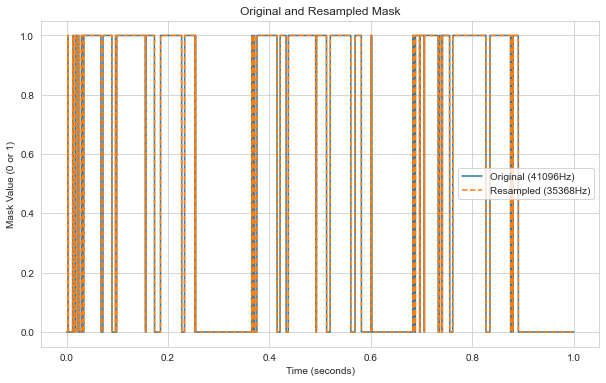

Mask detected


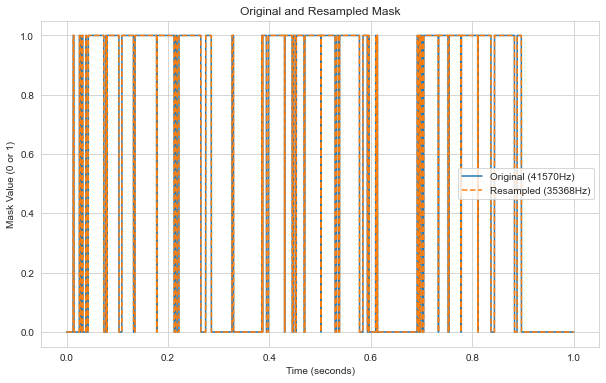

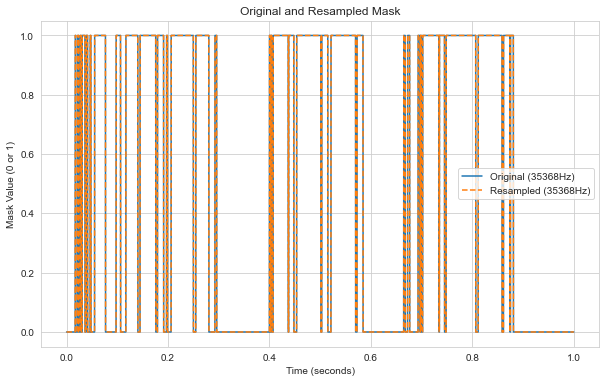

Mask detected


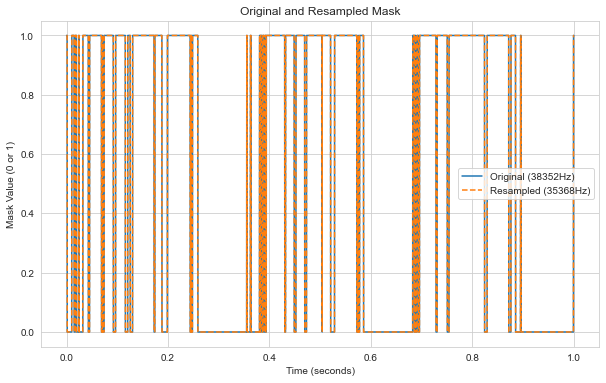

Mask detected


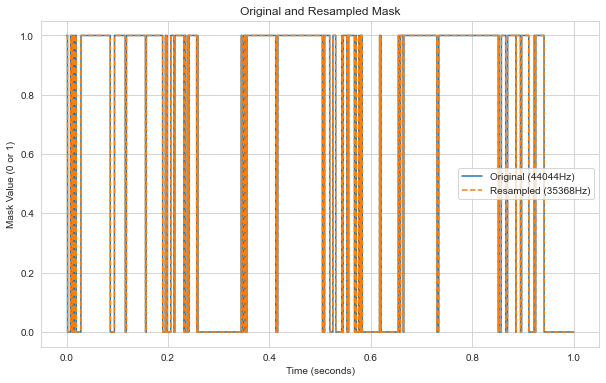

Mask detected


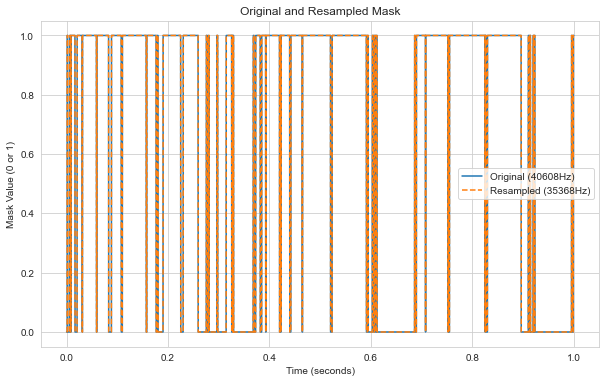

Mask detected


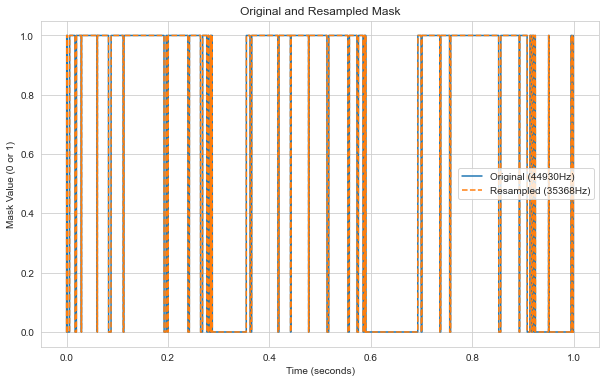

Mask detected


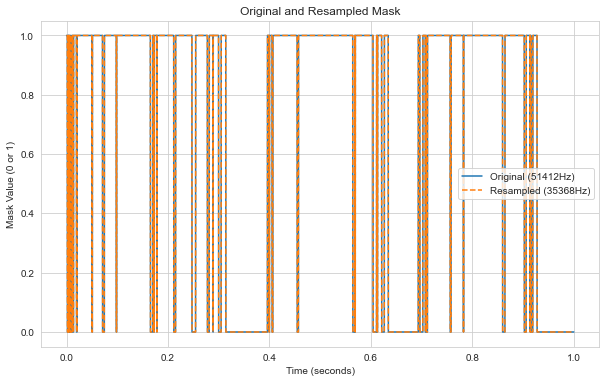

Angle detected


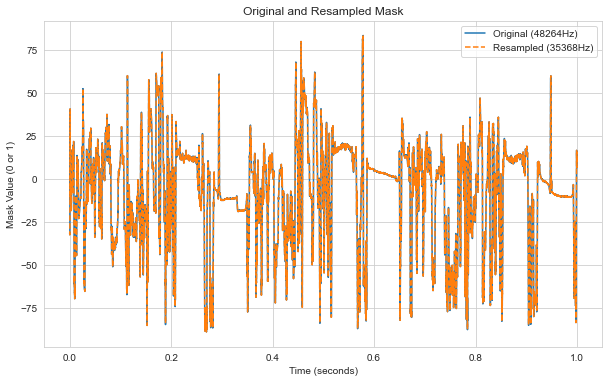

Angle detected


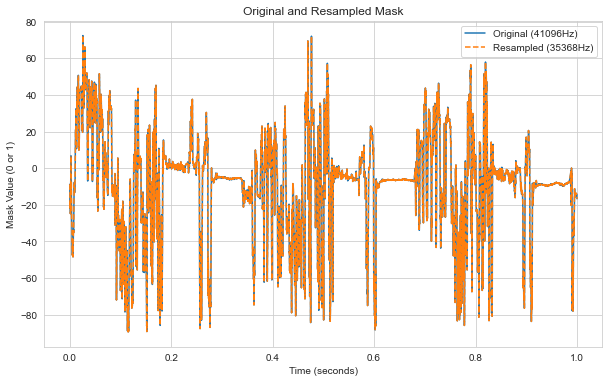

Angle detected


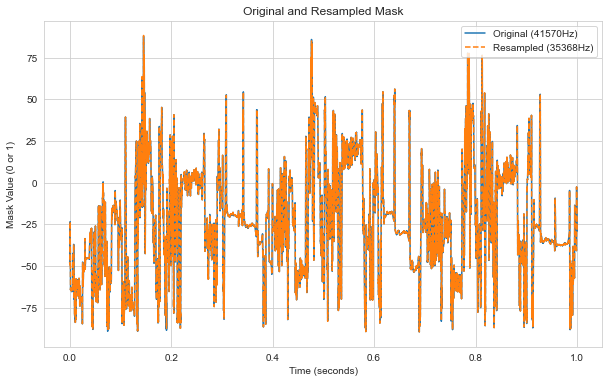

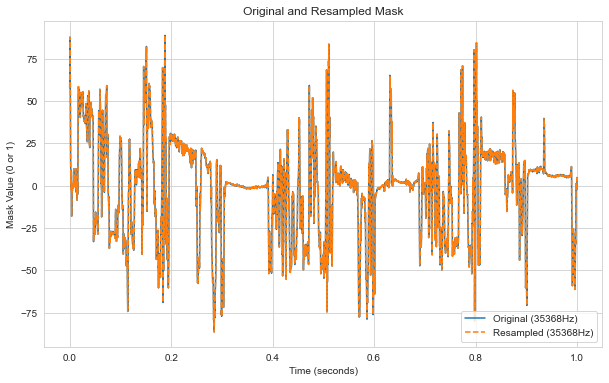

Angle detected


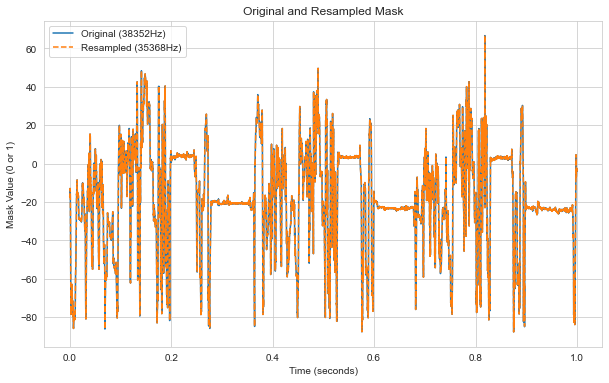

Angle detected


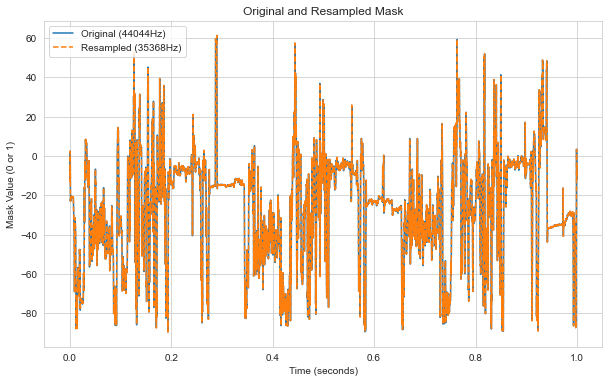

Angle detected


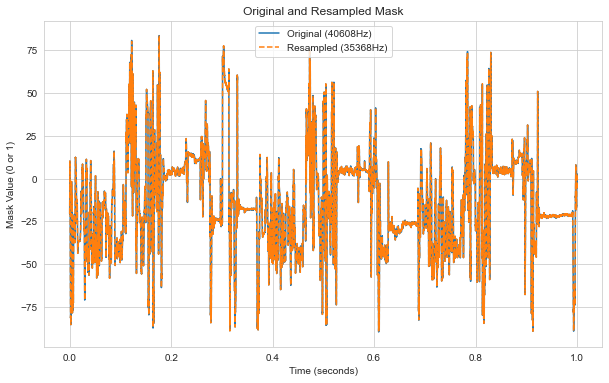

Angle detected


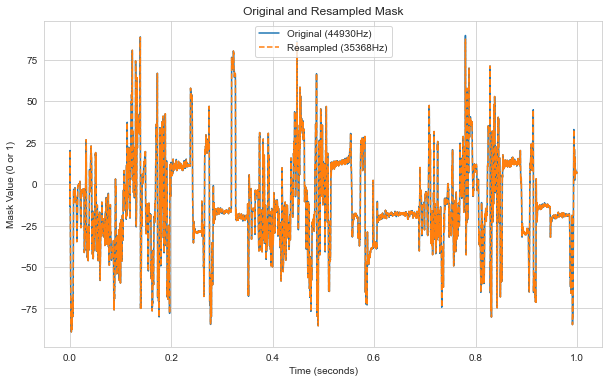

Angle detected


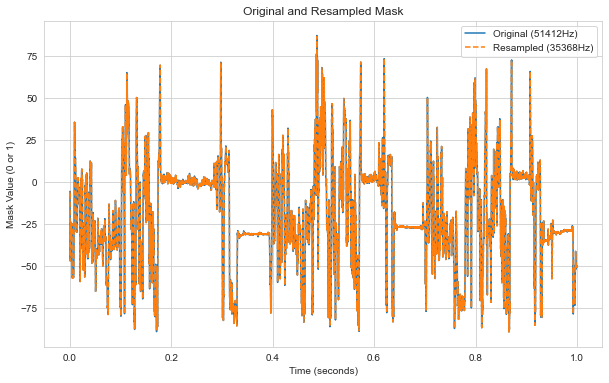

Angle detected


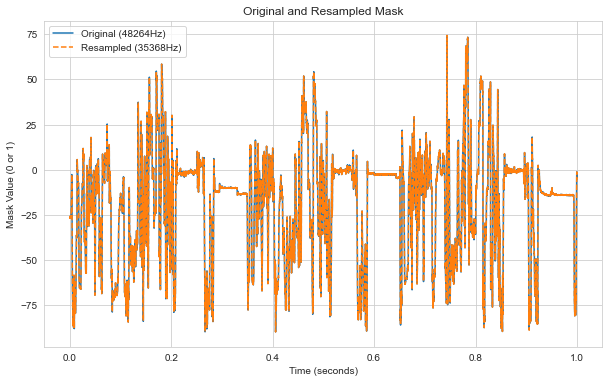

Angle detected


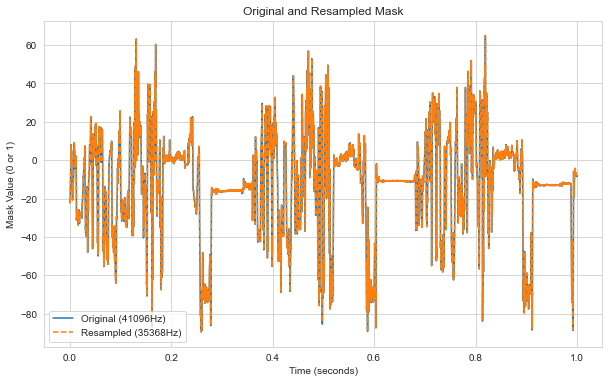

Angle detected


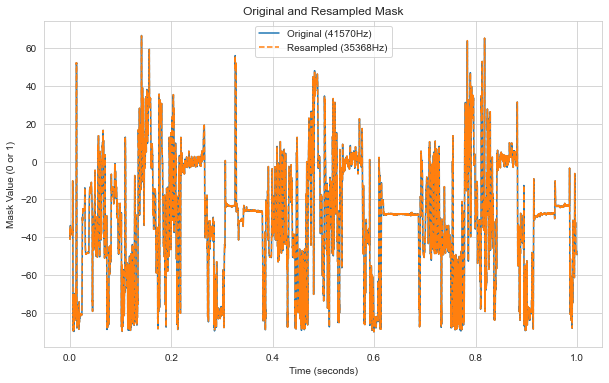

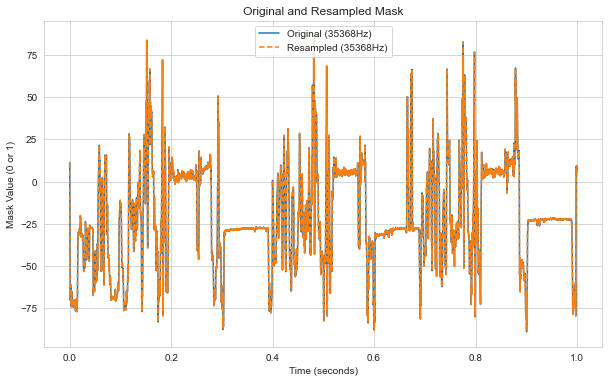

Angle detected


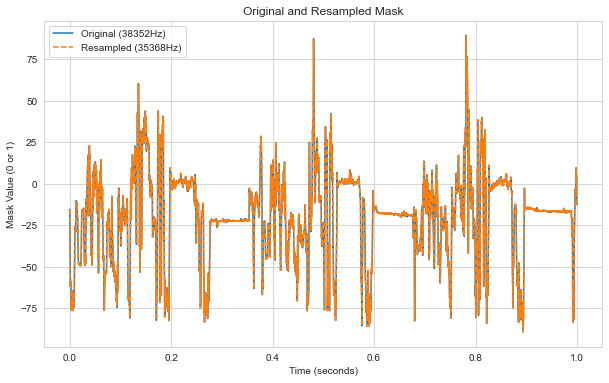

Angle detected


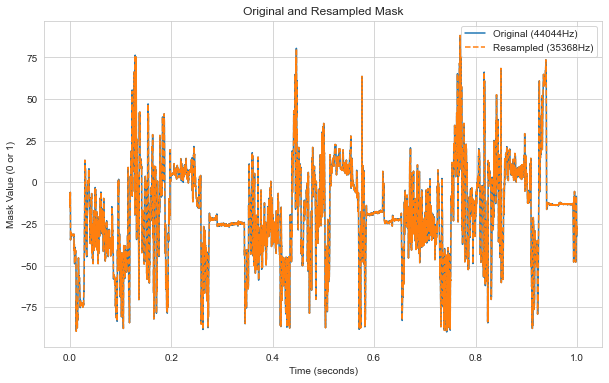

Angle detected


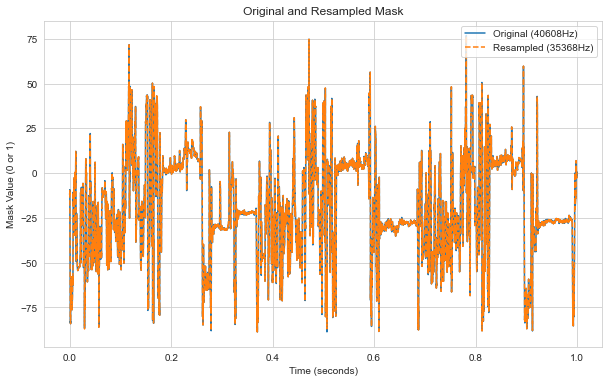

Angle detected


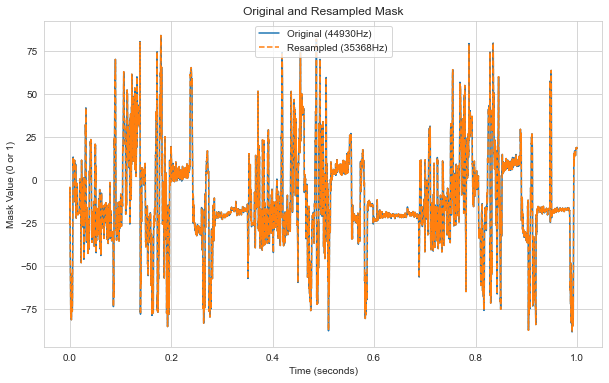

Angle detected


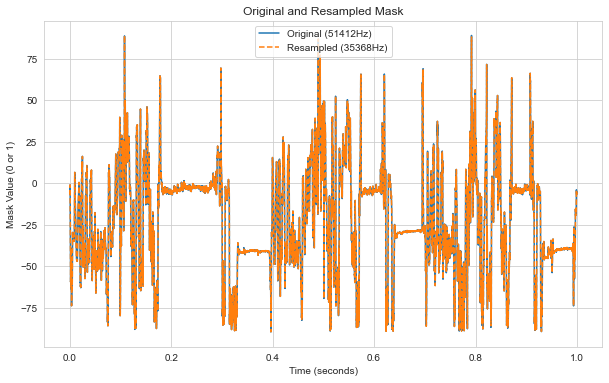

Angle detected


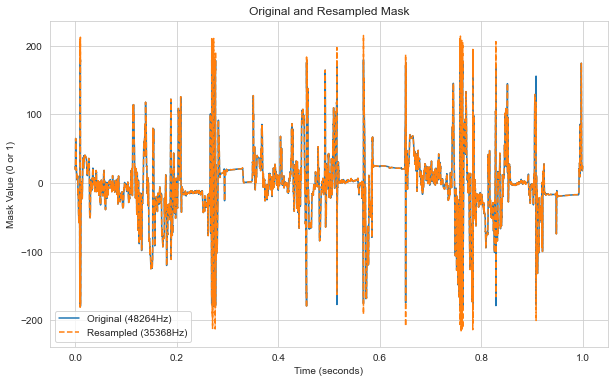

Angle detected


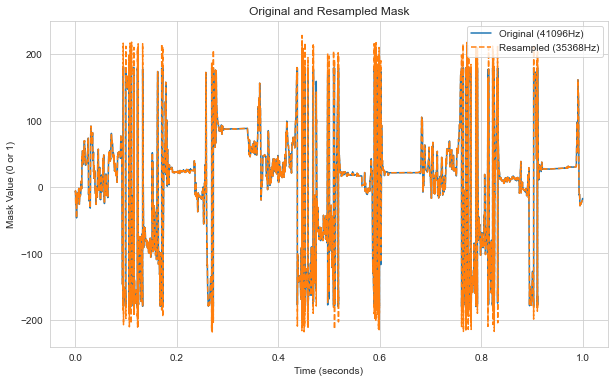

Angle detected


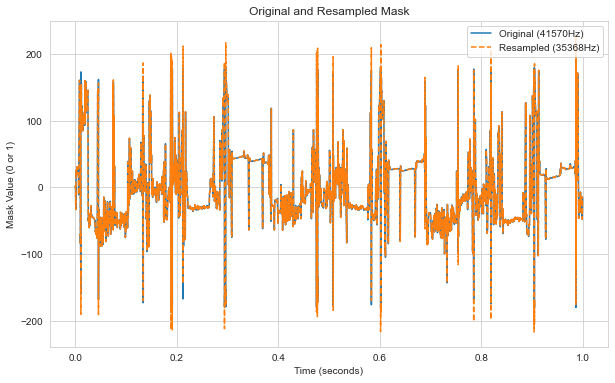

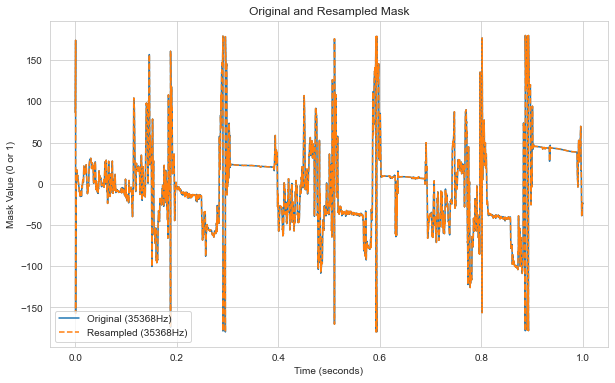

Angle detected


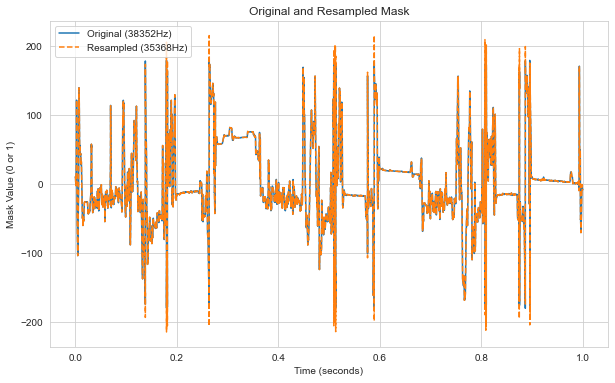

Angle detected


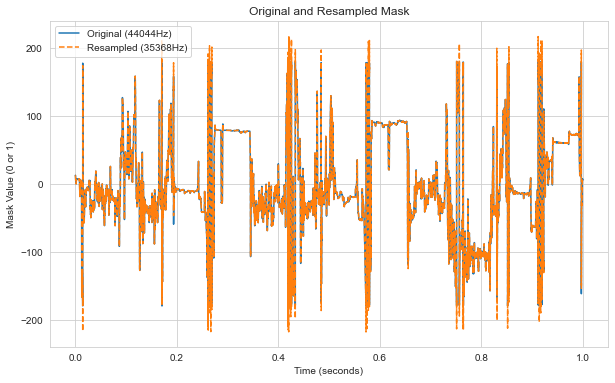

Angle detected


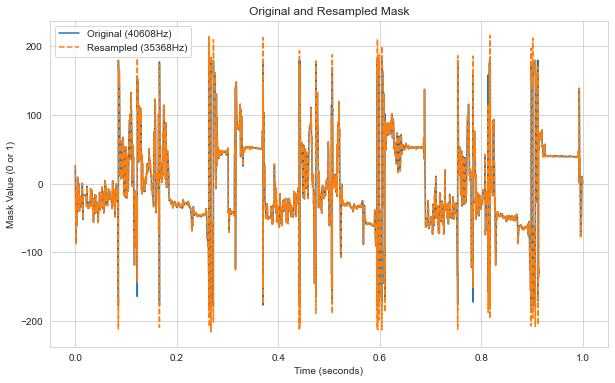

Angle detected


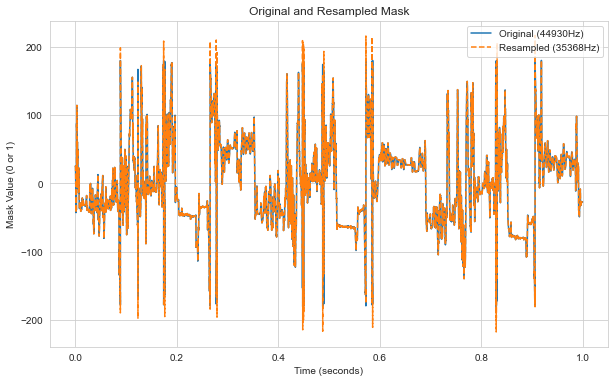

Angle detected


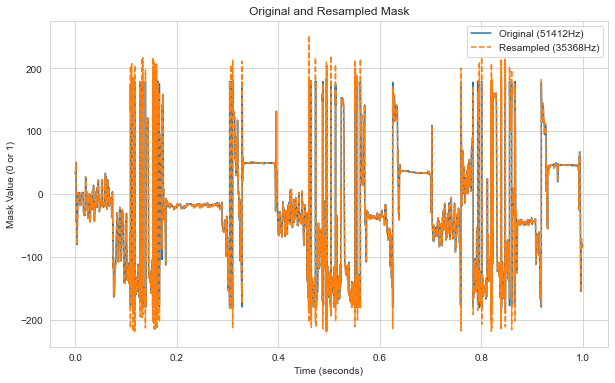

Angle detected


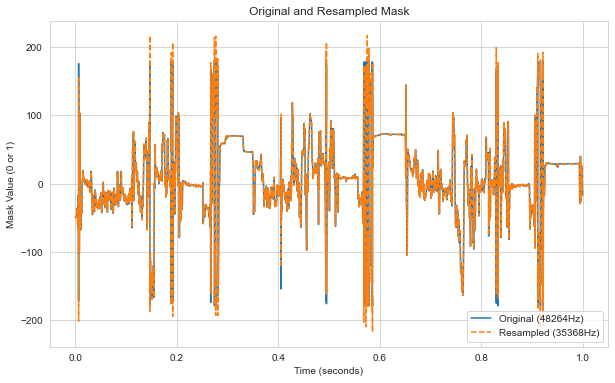

Angle detected


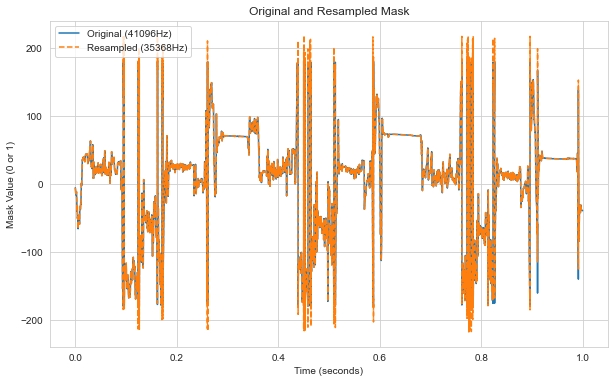

Angle detected


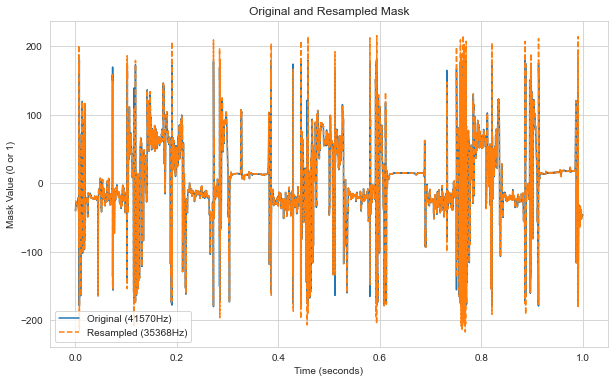

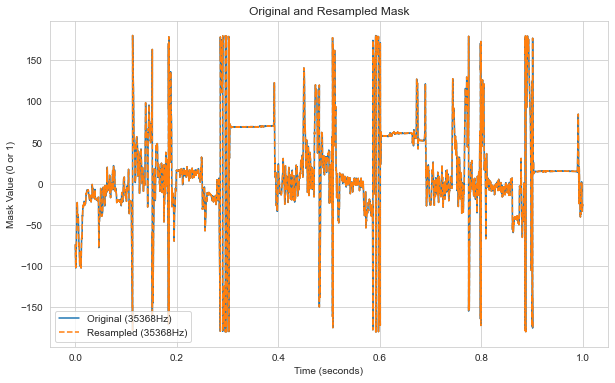

Angle detected


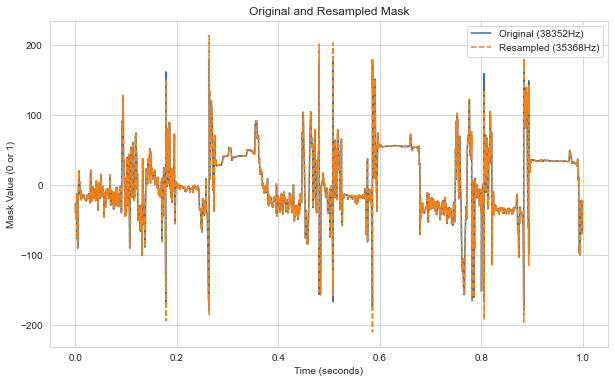

Angle detected


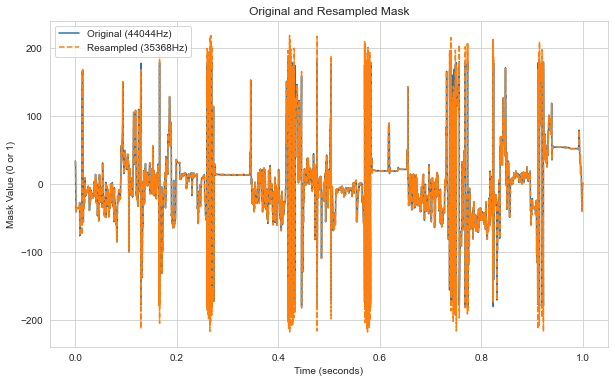

Angle detected


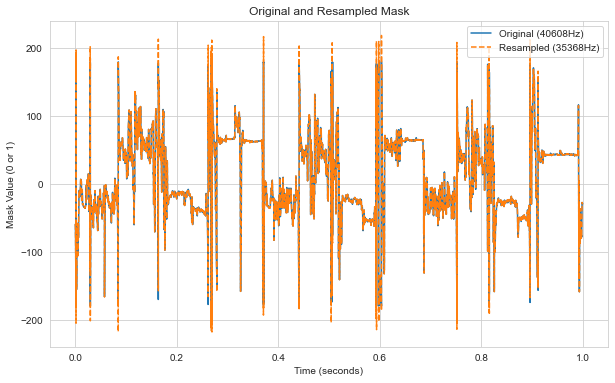

Angle detected


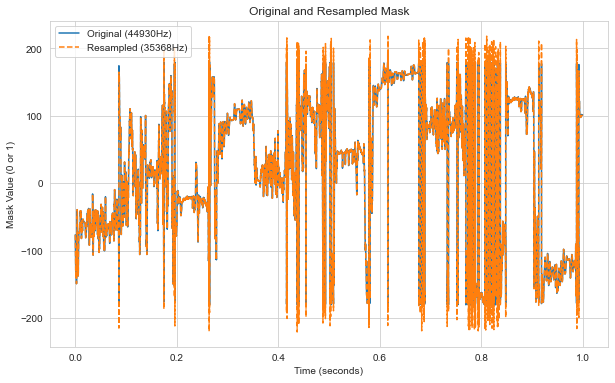

Angle detected


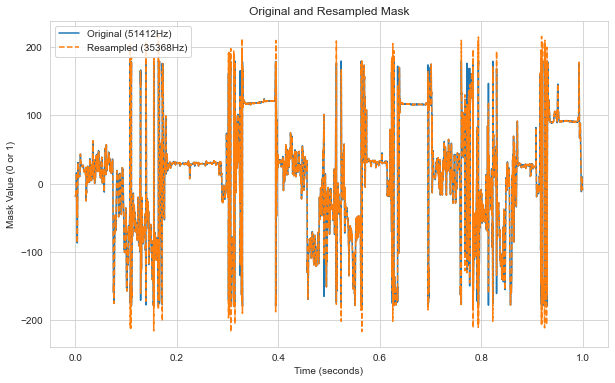

In [20]:
# Get group dataset by downsampling to the smallest dataset size 
# Some plots to ensure downsampling is correct 
group_GT_mask_NDH_50Hz = get_group_data(training_participant_paths, field = 'GT_mask_NDH_50Hz')
group_GT_mask_DH_50Hz = get_group_data(training_participant_paths, field = 'GT_mask_DH_50Hz')
group_pitch_NDH = get_group_data(training_participant_paths, field = 'pitch_NDH')
group_pitch_DH = get_group_data(training_participant_paths, field = 'pitch_DH')
group_yaw_NDH = get_group_data(training_participant_paths, field = 'yaw_NDH')
group_yaw_DH = get_group_data(training_participant_paths, field = 'yaw_DH')

In [21]:
# Compute optimal FS using training data  
# Find optimal FS by maximization of the Younden Index
group_optimal_FS_NDH = optimal_group_fs_computation(group_pitch_NDH, group_yaw_NDH, group_GT_mask_NDH_50Hz, optimal=True)
group_optimal_FS_DH = optimal_group_fs_computation(group_pitch_DH, group_yaw_DH, group_GT_mask_DH_50Hz, optimal=True)
# Save  the group optimal FS values  
save_optimal_threshold(initial_path, group_optimal_FS_NDH, group_optimal_FS_DH, AC = False, group = trained_group)
print(group_optimal_FS_NDH, group_optimal_FS_DH)

Thresholds saved successfully at: ../CreateStudy\H_optimal_threshold_GM.csv
53 53


In [22]:
# Group optimal parameters plotted on top of the individual parameter distribution across participants # 

In [23]:
H_AC_ndh, H_AC_dh, S_AC_ndh, S_AC_dh, H_GM_ndh, H_GM_dh, S_GM_ndh, S_GM_dh = get_group_optimal_thresholds(initial_path)

In [24]:
H_AC_ndh, H_AC_dh, S_AC_ndh, S_AC_dh, H_GM_ndh, H_GM_dh, S_GM_ndh, S_GM_dh

(24.0, 11.6, 86.0, 132.6, 53, 53, 75, 53)

Figure saved at ../CreateStudy/figures/boxplot_AC.png


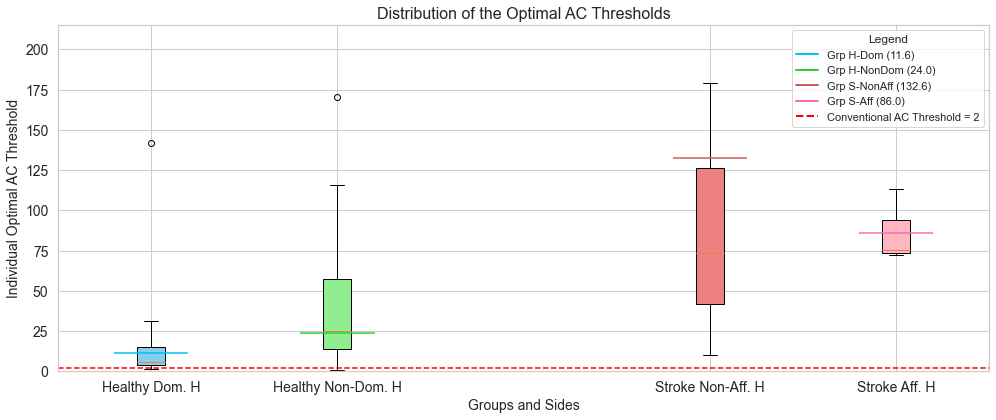

In [25]:
#Plot for AC metric
plot_side_by_side_boxplots_both_group(
        h_array_optimal_AC_NDH, h_array_optimal_AC_DH,
        s_array_optimal_AC_DH, s_array_optimal_AC_NDH,
        H_AC_ndh, H_AC_dh,
        S_AC_dh, S_AC_ndh,
        metric='AC', path=figures_path)

Figure saved at ../CreateStudy/figures/boxplot_GM.png


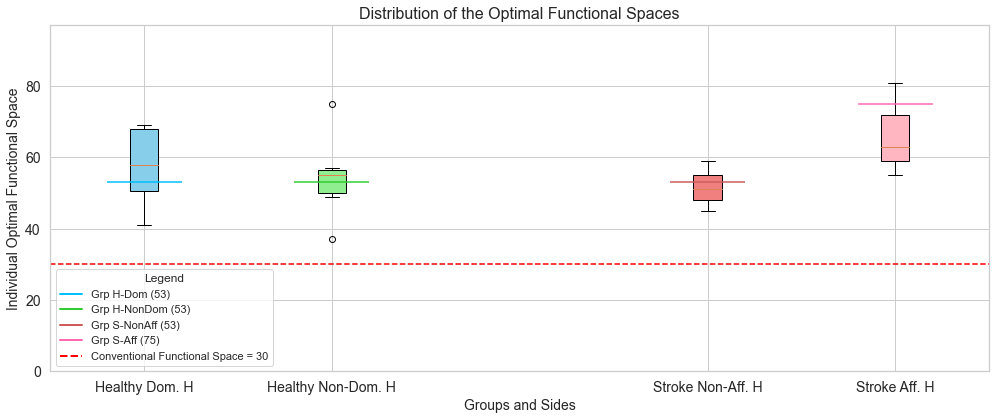

In [26]:
# Plot for GM metric
plot_side_by_side_boxplots_both_group(
        h_array_optimal_FS_NDH, h_array_optimal_FS_DH,
        s_array_optimal_FS_DH, s_array_optimal_FS_NDH,
        H_GM_ndh, H_GM_dh,
        S_GM_dh, S_GM_ndh,
        metric='GM', path=figures_path)

AC detected


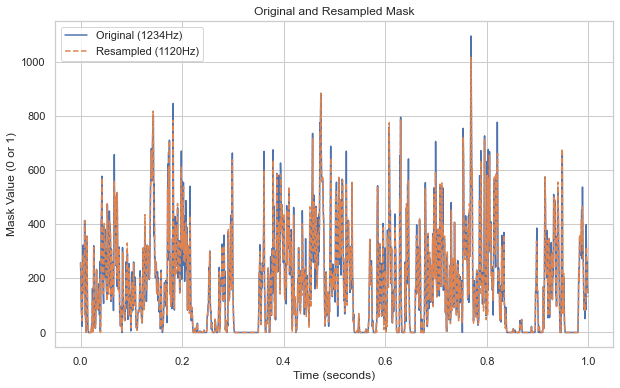

AC detected


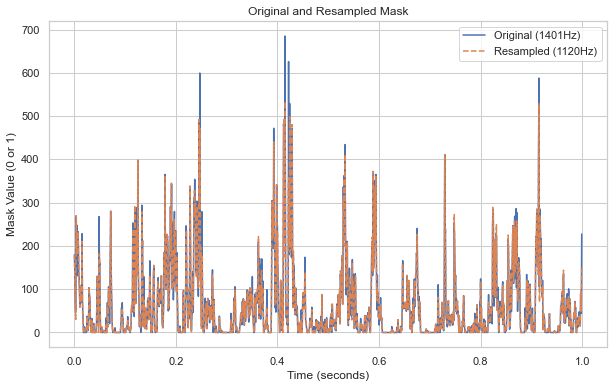

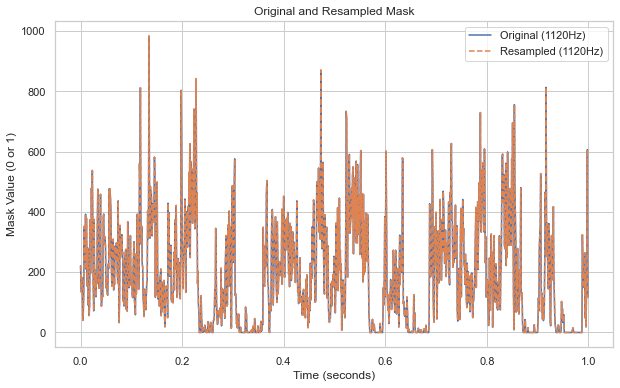

AC detected


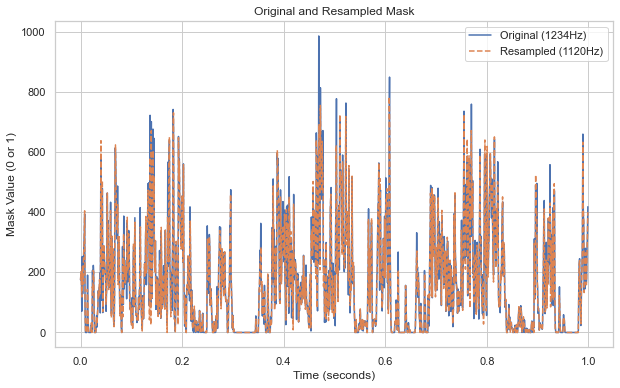

AC detected


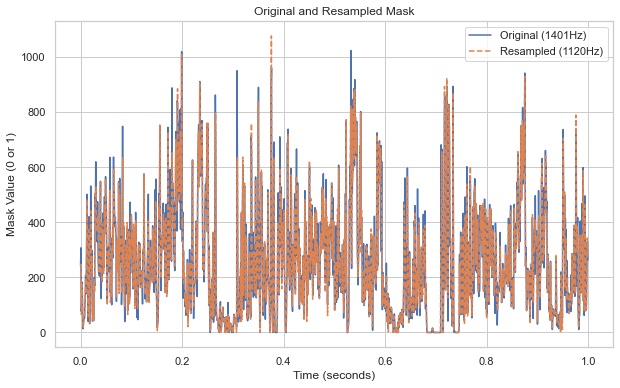

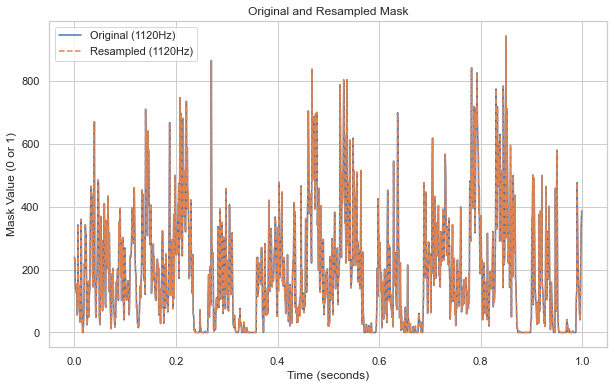

Mask detected


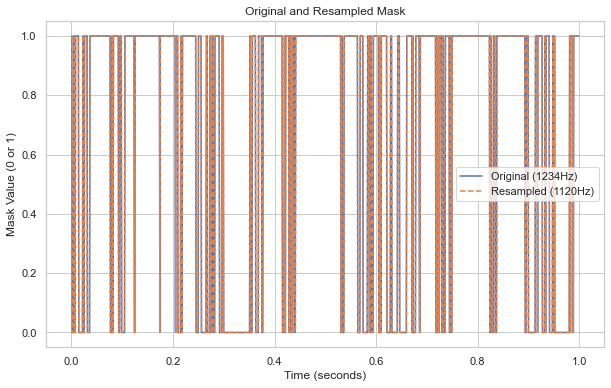

Mask detected


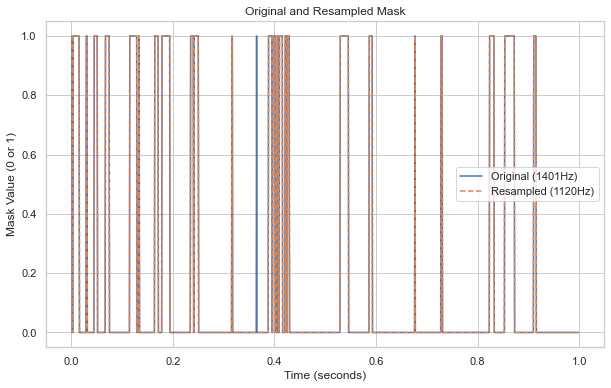

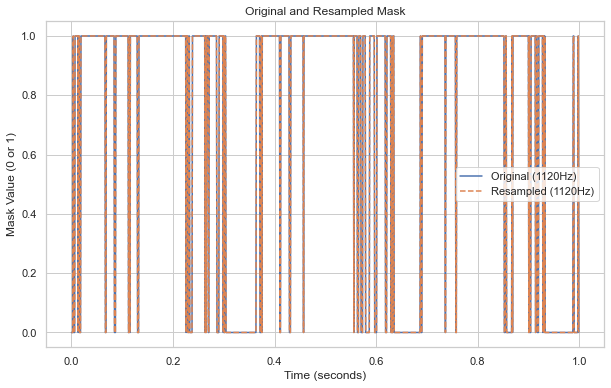

Mask detected


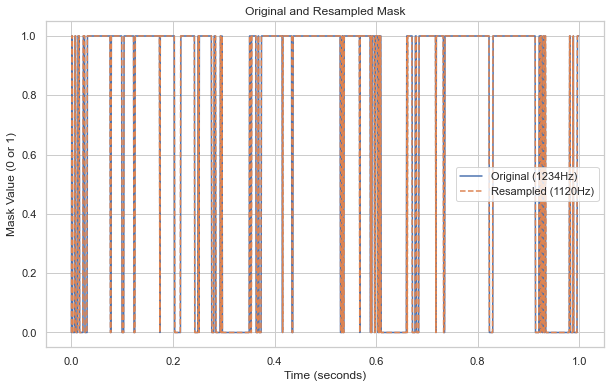

Mask detected


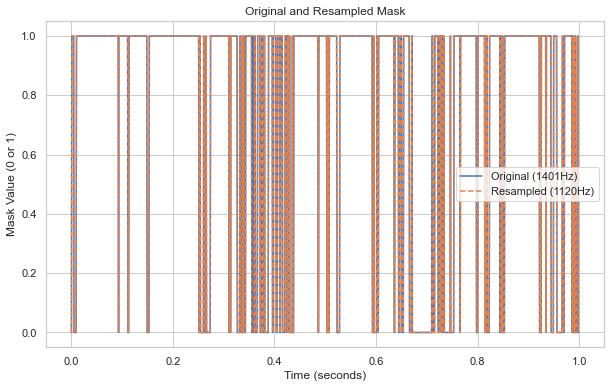

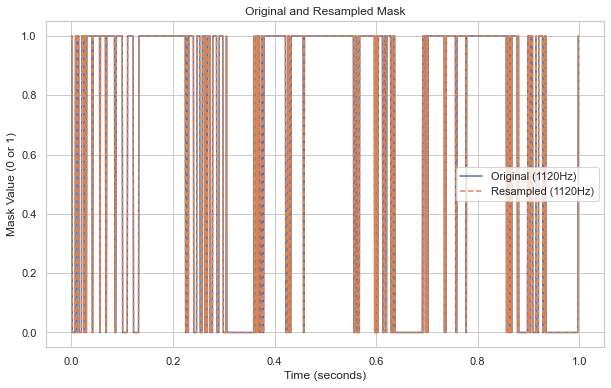

Mask detected


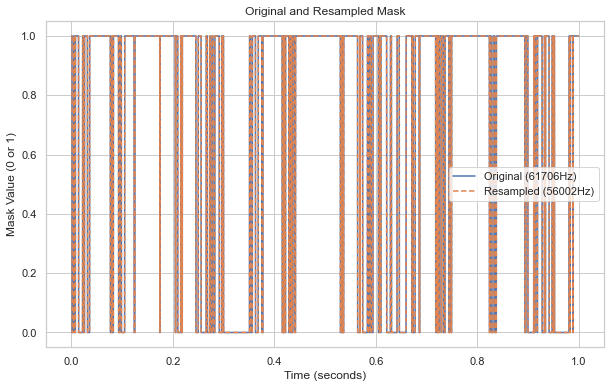

Mask detected


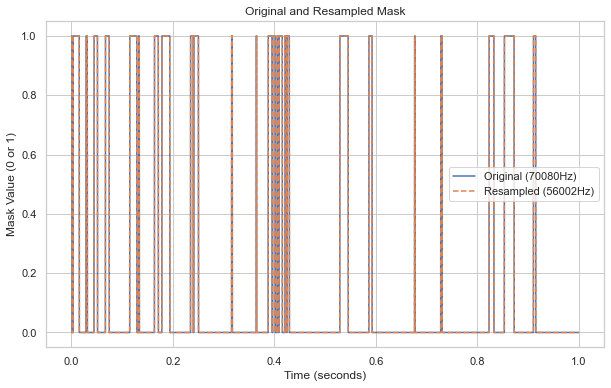

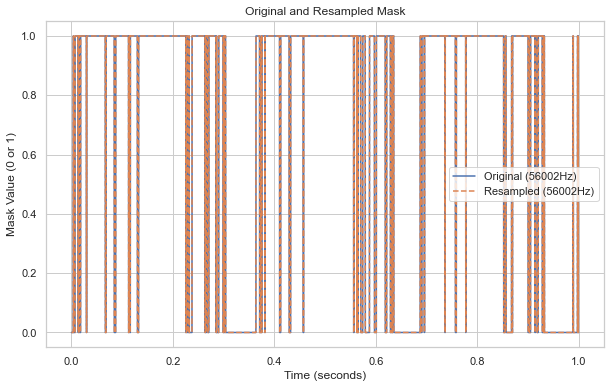

Mask detected


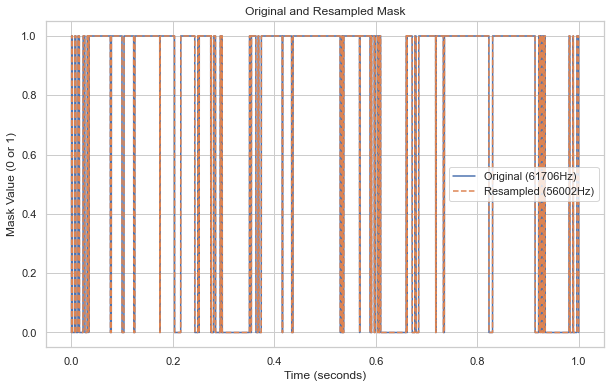

Mask detected


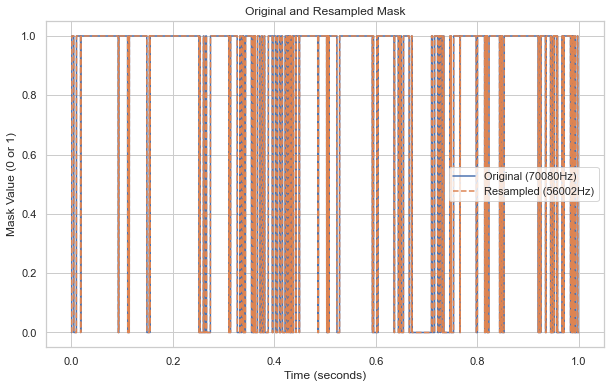

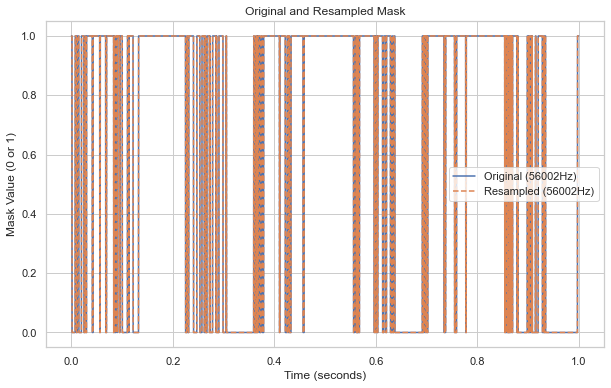

Mask detected


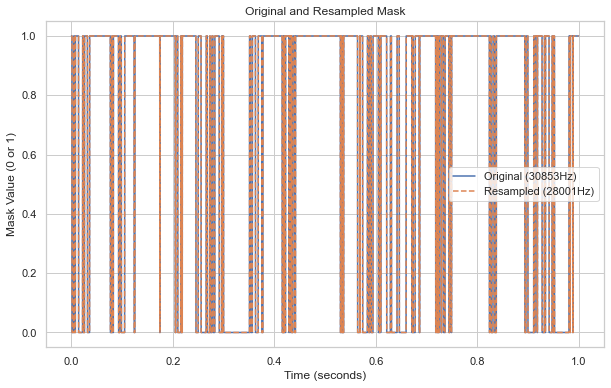

Mask detected


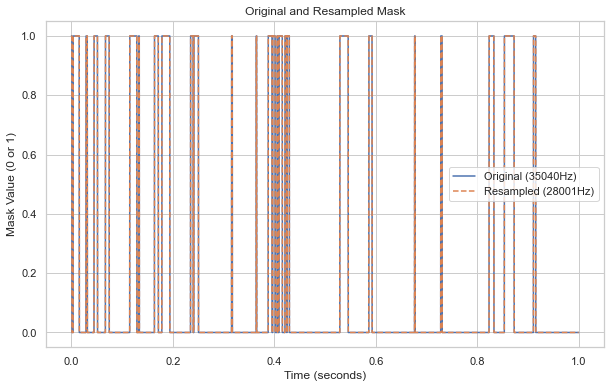

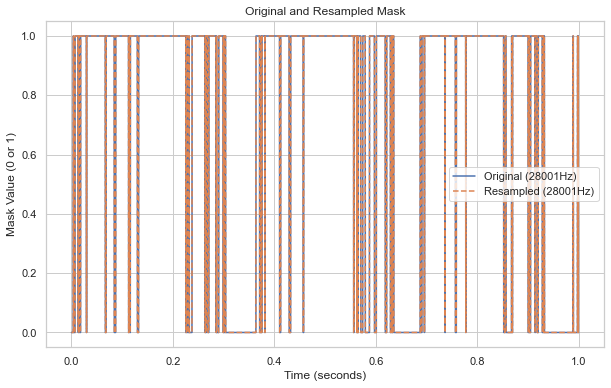

Mask detected


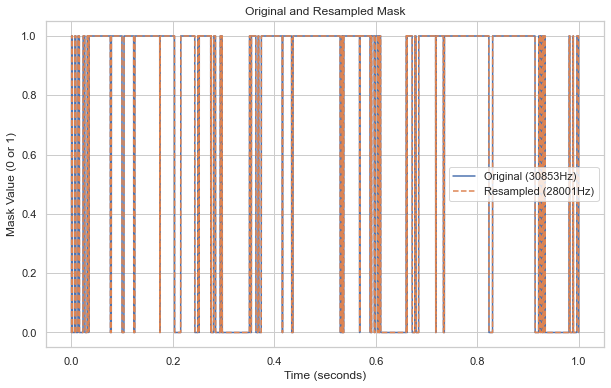

Mask detected


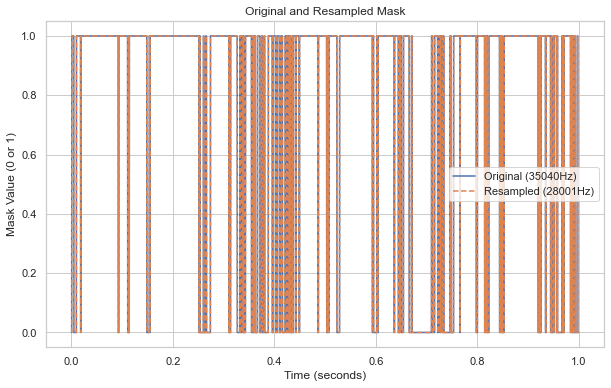

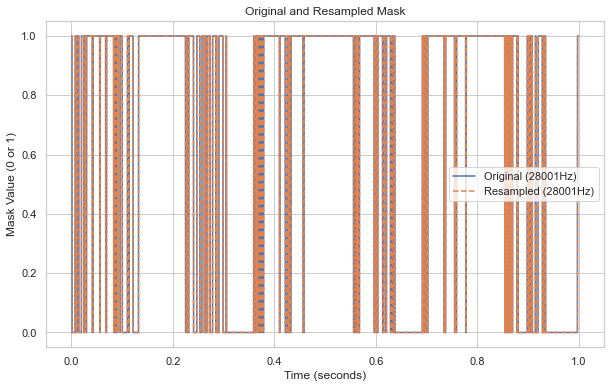

Angle detected


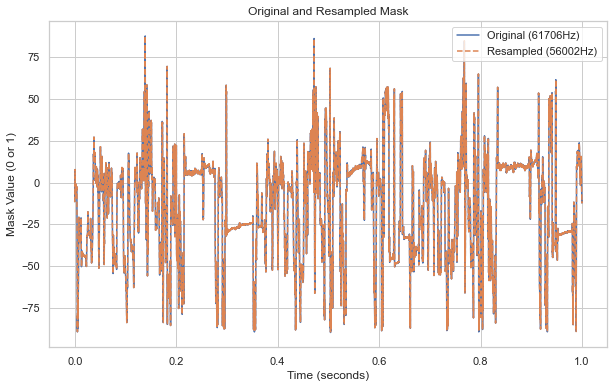

Angle detected


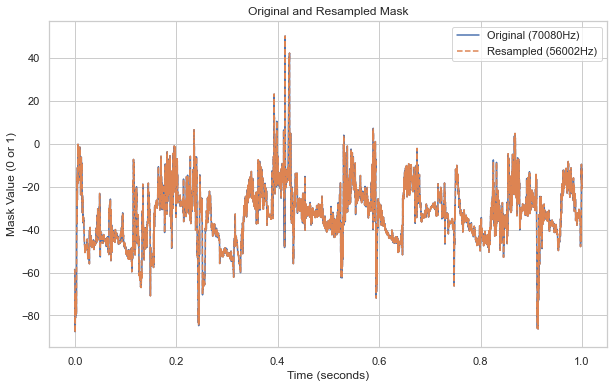

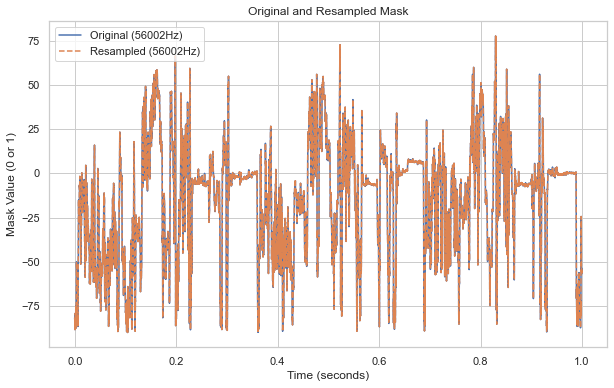

Angle detected


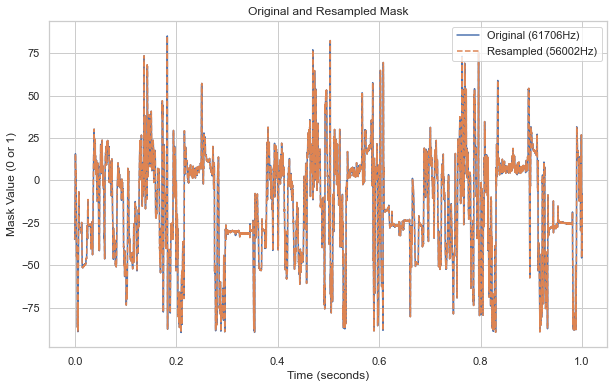

Angle detected


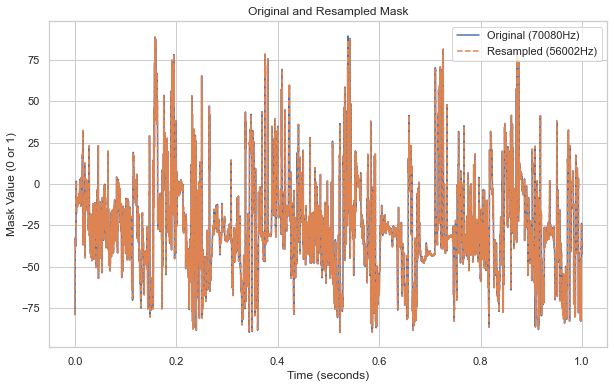

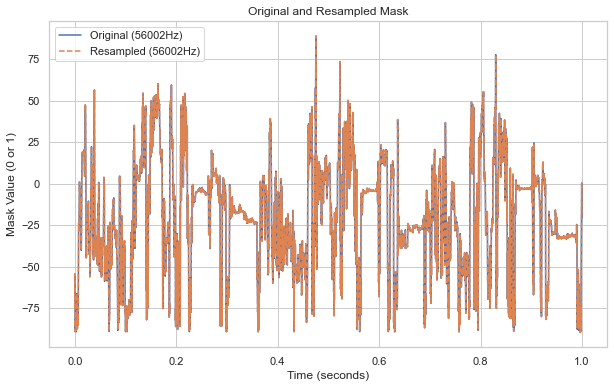

Angle detected


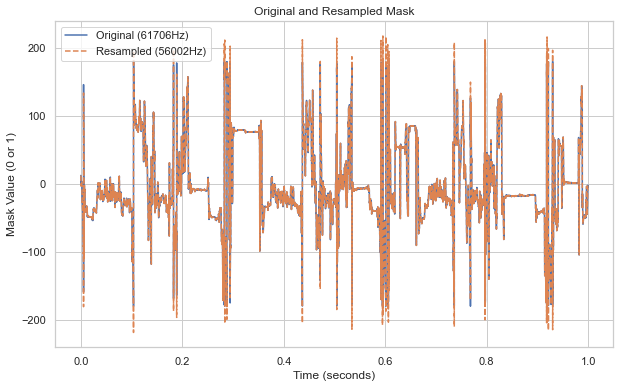

Angle detected


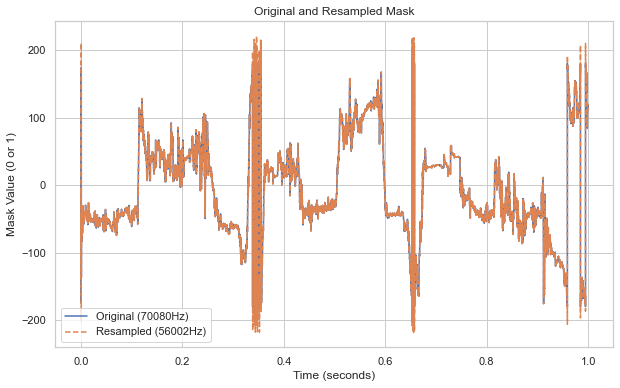

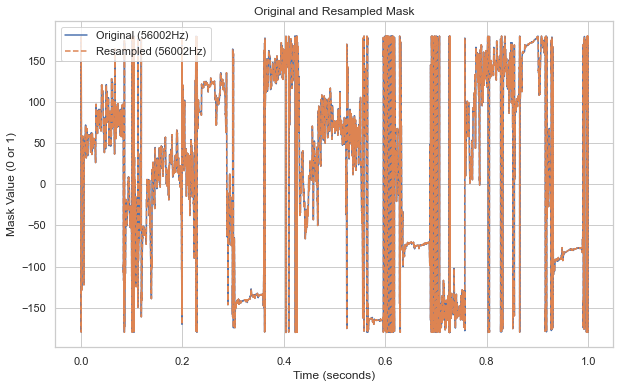

Angle detected


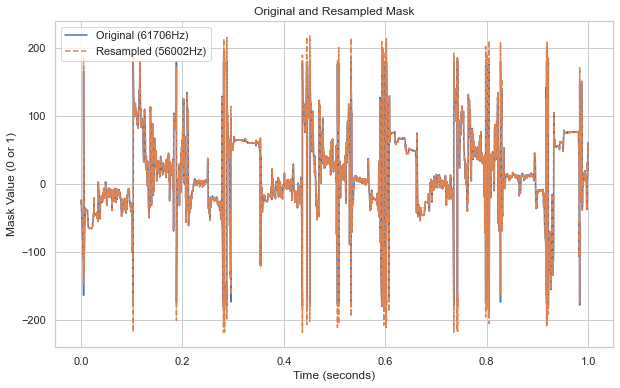

Angle detected


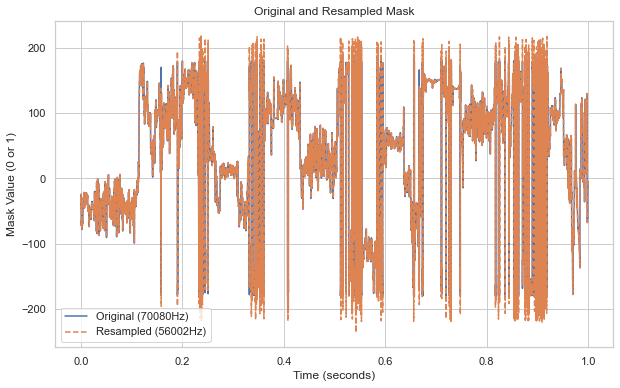

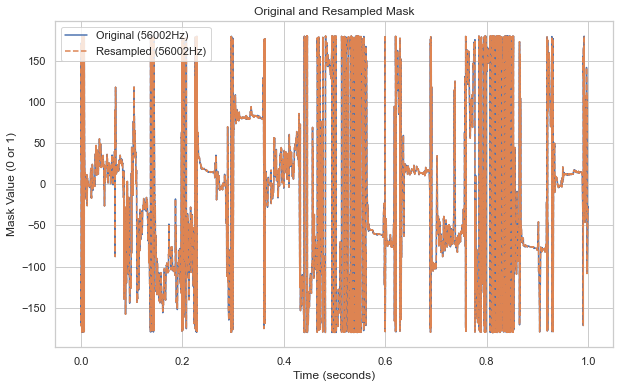

Data saved to: ../CreateStudy\S_merged\S_merged.json
Dataset has been saved at: ../CreateStudy\S_merged


In [27]:
# Create a Merged testing participant if needed (eg using all the S datasets) # 
testing_group = 'S'
testing_participant_paths = get_json_paths(initial_path, testing_group, excluded_participant=None)
merged_testing_dataset = compute_testing_participant(testing_participant_paths, testing_group, initial_path)

In [28]:
# PART 3 # 
# Testing on unseen dataset #

In [29]:
# CHANGE HERE
# Merged Stroke dataset can be used with the participant_id = 'S_merged'
testing_participant_id = 'S003'
testing_group = 'S'

In [30]:
# PATH 
testing_figures_path = os.path.join(figures_path, f"testing_{testing_participant_id}")
# Invoke the create_folder function to create the directory
create_folder(testing_figures_path)

In [31]:
# Load dataset 
testing_dataset = load_participant_json(testing_participant_id, initial_path)
print(testing_dataset)
# Get the dict of GT @ 25 Hz
# Dict containing only GT at 25 Hz
testing_dict_GT = get_GT_dict(testing_dataset)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [32]:
# Create a dict to store all the thresholds: optimal and conventional 
thresholds = {
    'group_AC_NDH': group_optimal_AC_NDH,
    'group_AC_DH': group_optimal_AC_DH,
    'group_optimal_FS_NDH': group_optimal_FS_NDH,
    'group_optimal_FS_DH': group_optimal_FS_DH,
    'conventional_AC_threshold_unilateral': conventional_threshold_unilateral,
    'conventional_AC_threshold_bilateral': conventional_threshold_bilateral,
    'conventional_functional_space': conventional_functional_space
}

In [33]:
thresholds

{'group_AC_NDH': 24.0,
 'group_AC_DH': 11.6,
 'group_optimal_FS_NDH': 53,
 'group_optimal_FS_DH': 53,
 'conventional_AC_threshold_unilateral': 2,
 'conventional_AC_threshold_bilateral': 0,
 'conventional_functional_space': 30}

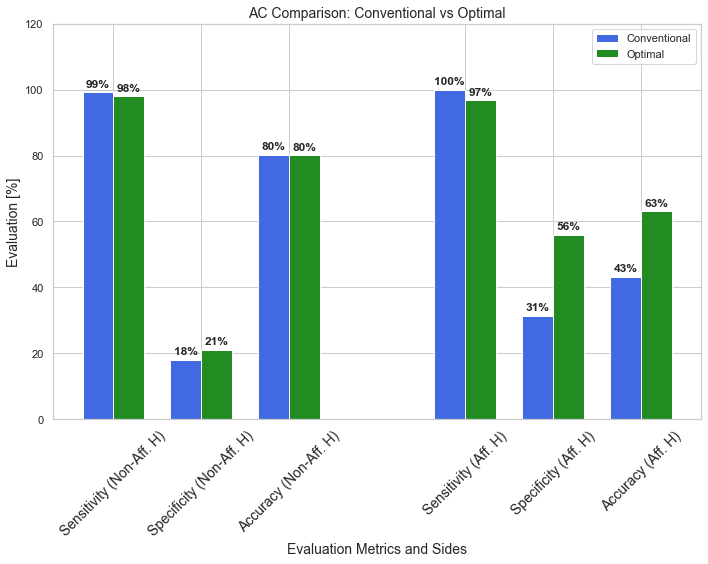

In [41]:
# Test new optimal AC Threshold values on unseen data using the testing participant 
ac_scores, ac_eval_metrics = compute_evaluation_metrics(testing_dataset, thresholds, metric = 'AC')
# Plot the evaluation results 
plot_combined_evaluation_metrics(ac_eval_metrics, figures_path = None, participant_id = testing_participant_id, metric = 'AC', group = testing_group)

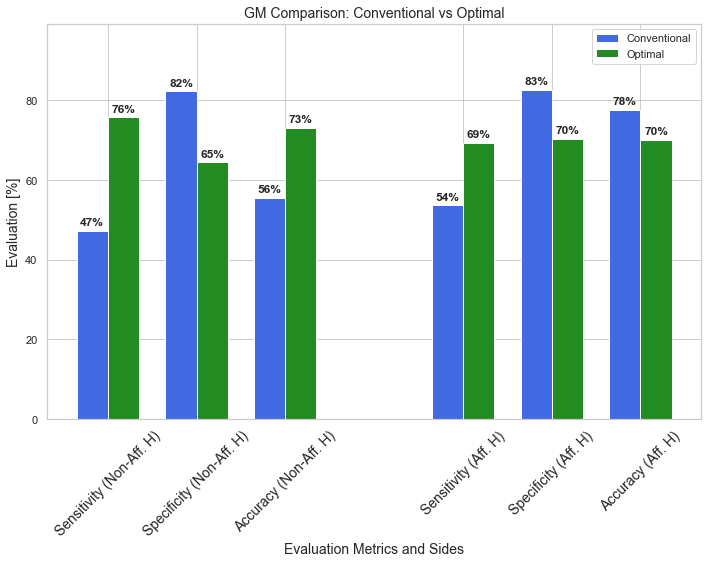

In [42]:
# Test new optimal FS values on unseen data using the testing participant 
gm_scores, gm_eval_metrics = compute_evaluation_metrics(testing_dataset, thresholds,  metric = 'GM')
# Plot the evaluation results 
plot_combined_evaluation_metrics(gm_eval_metrics, figures_path = None, metric = 'GM', participant_id = testing_participant_id, group = testing_group)

Figure saved at ../CreateStudy/figures\testing_S003\GMAC_combined.png


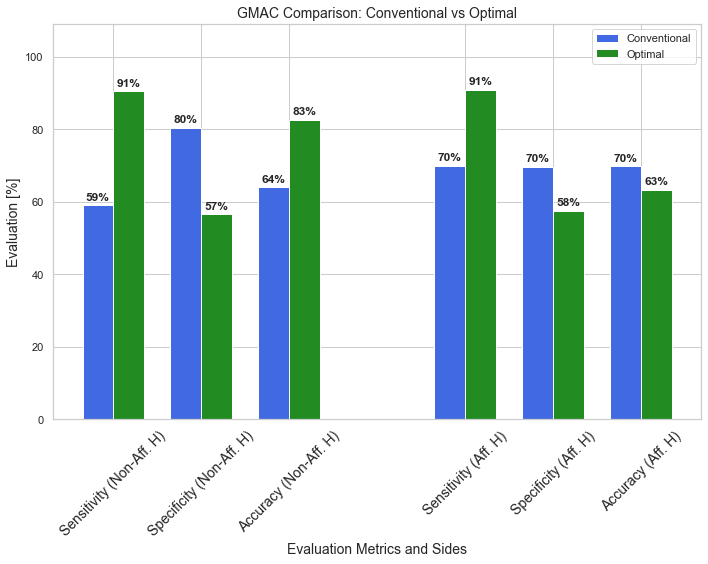

In [43]:
# GMAC
gmac_scores, gmac_eval_metrics = compute_evaluation_metrics(testing_dataset, thresholds, metric = 'GMAC')
# Plot the evaluation results 
plot_combined_evaluation_metrics(gmac_eval_metrics, figures_path = figures_path, metric = 'GMAC', participant_id = testing_participant_id, group = testing_group)

In [44]:
# Compute duration of functional arm use on testing dataset
# Get duration of arm use and corresponding % 
gmac_duration_arm_use = get_duration_functional_arm_use(gmac_scores, sampling_frequency = frequency_gmac)
ac_duration_arm_use = get_duration_functional_arm_use(ac_scores, sampling_frequency = frequency_gmac)
gm_duration_arm_use = get_duration_functional_arm_use(gm_scores, sampling_frequency = frequency_gm)
GT_25Hz_duration_arm_use = get_duration_functional_arm_use(testing_dict_GT, sampling_frequency = 25)

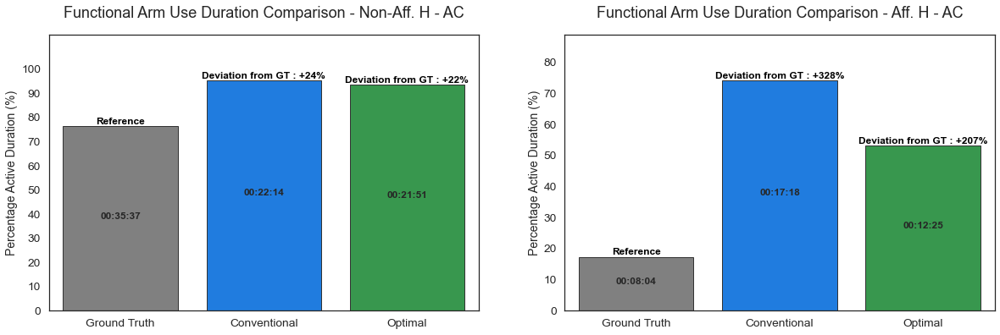

In [45]:
# Plot duration of arm use comparaison 
compare_arm_use_duration_plot(GT_25Hz_duration_arm_use, ac_duration_arm_use, 'AC', group = testing_group, save_path = None)

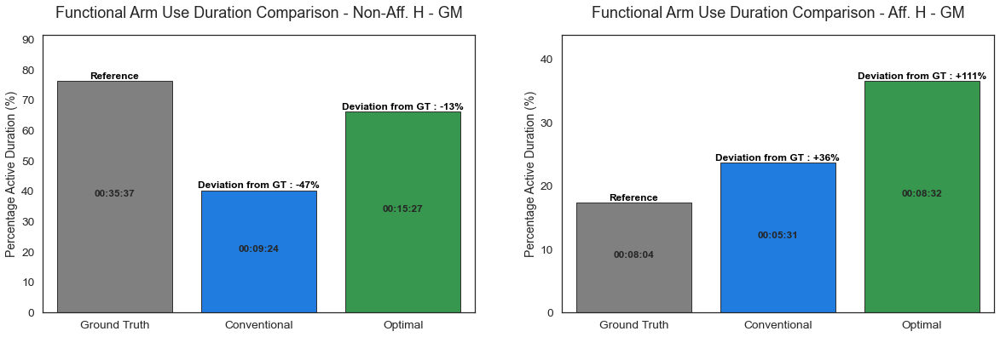

In [46]:
compare_arm_use_duration_plot(GT_25Hz_duration_arm_use, gm_duration_arm_use, 'GM', group = testing_group, save_path = None)

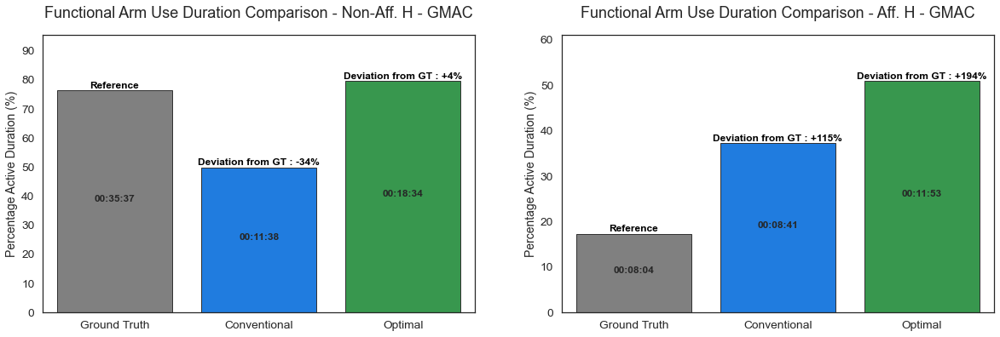

In [47]:
compare_arm_use_duration_plot(GT_25Hz_duration_arm_use, gmac_duration_arm_use, 'GMAC', group = testing_group, save_path = None)